In [1]:
import sys
formerPath = sys.path
sys.path.append('./code/')
sys.path.append('./BS/')

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI


from Bisect import bisect
from newton import newton
from BSImplVol import bsimpvol

import importlib

# Load modules and external files

You need to import four python scripts for implied volatility calibration :
- *newton.py*
- *BSImplVol.py*
- *BS.py*
- *Bisect.py*

In [3]:
%load_ext autoreload
%autoreload 2


In [385]:
#Load python files to google colaborative environment
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

ModuleNotFoundError: No module named 'google.colab'

In [3]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

# Load data with google colab 

#### From excel file :

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [3]:
#Load csv files to get data
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

ModuleNotFoundError: No module named 'google.colab'

In [3]:
workingFolder = "./data/09082001/"

Bootstrap discounting


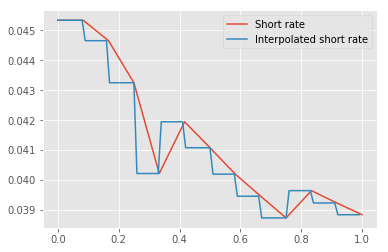

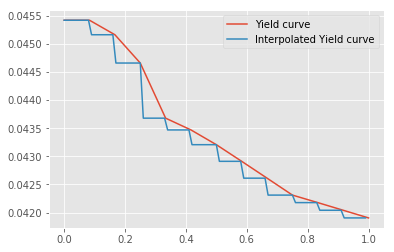

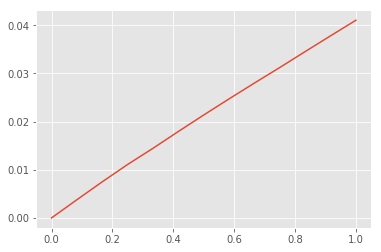

Bootstrap dividend


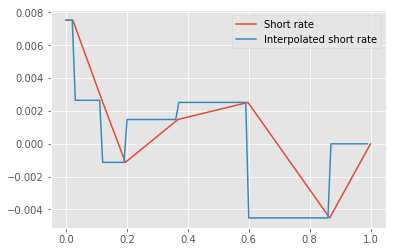

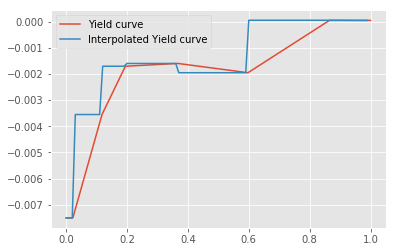

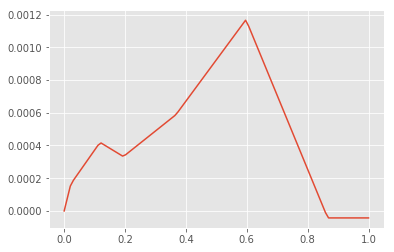

In [189]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


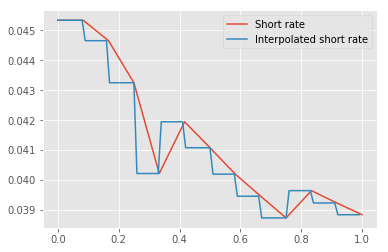

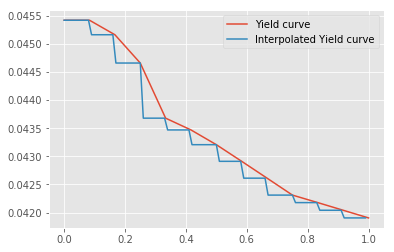

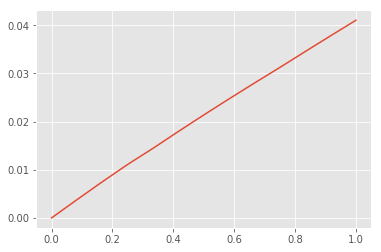

Bootstrap dividend


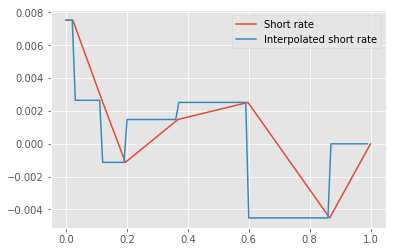

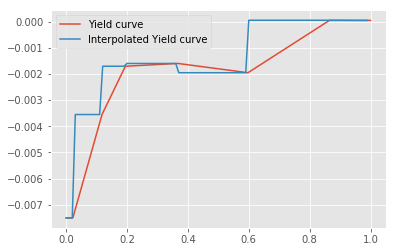

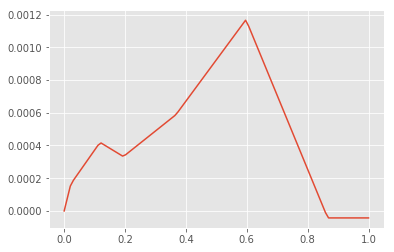

In [18]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [40]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [5]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

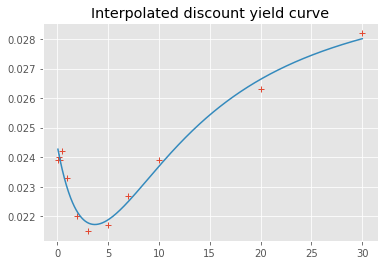

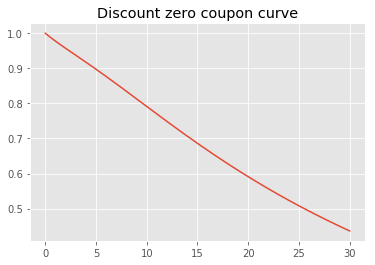

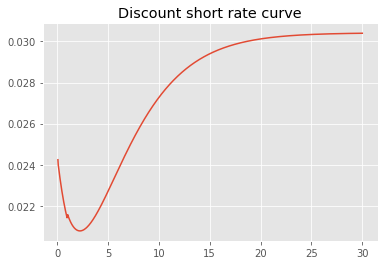

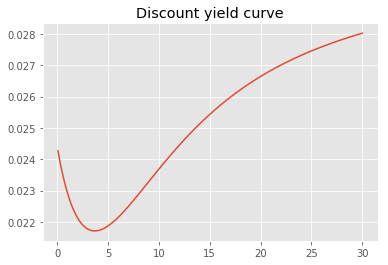

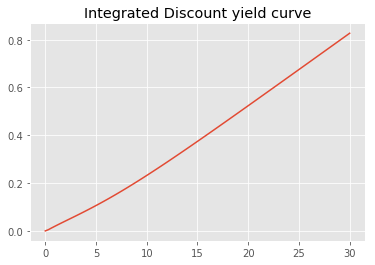

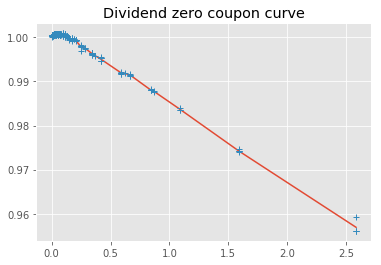

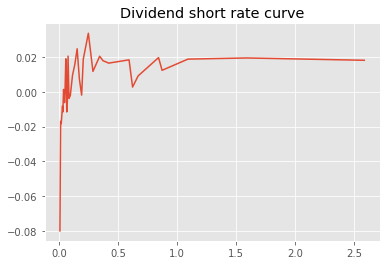

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


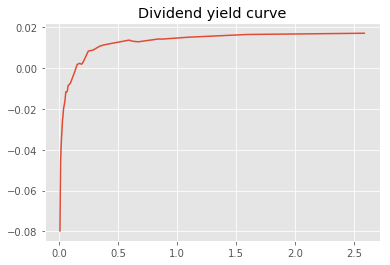

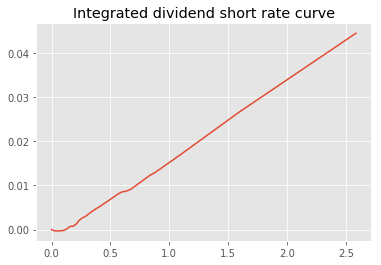

In [3]:
workingFolder = "./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [8]:
importlib.reload(bootstrapping)

<module 'dataSetConstruction' from './code/dataSetConstruction.py'>

####  Eurostoxx data

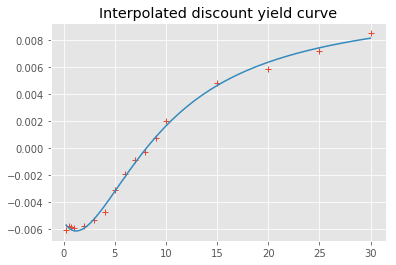

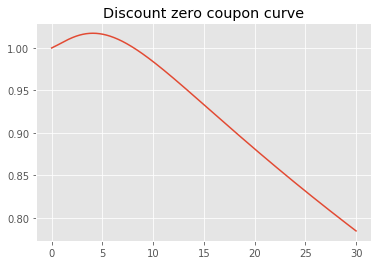

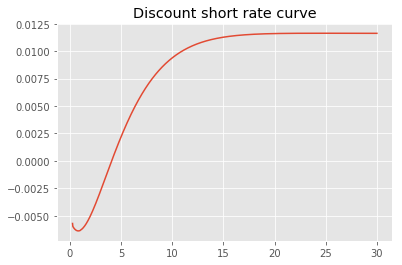

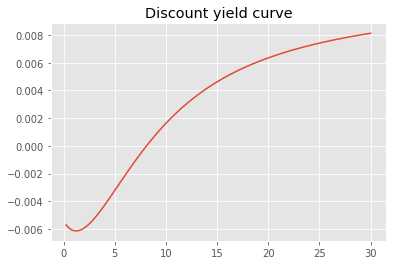

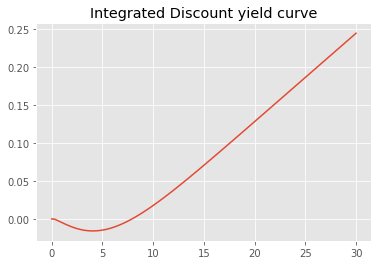

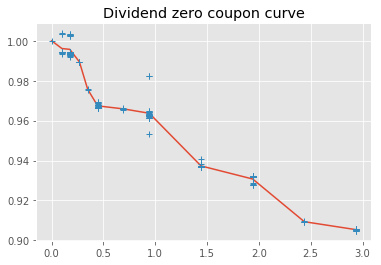

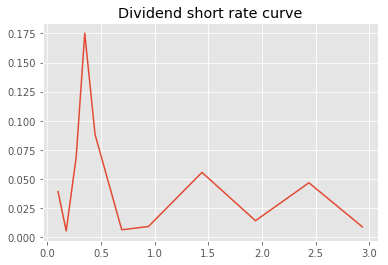

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


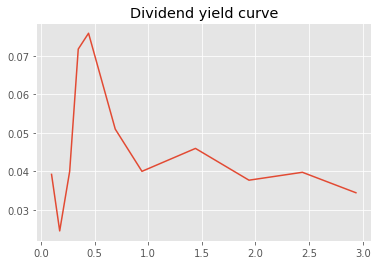

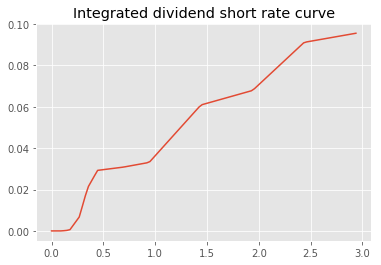

In [317]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [192]:
bootstrap.discountShortRate(10)

array(0.009402)

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [43]:
dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
                                       S0, 
                                       bootstrap)

ValueError: attempt to get argmax of an empty sequence

In [4]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
1700.0,0.246,0.80,-0.004171,17.445534,0.009788,-0.000018,15.329284,1697.643924,0.997527,1700.0,0.246,0.4147,0.062925,-1.0,-0.521416,0.042306
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-0.000055,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013
2600.0,0.170,15.05,-0.122026,238.644663,0.208757,0.000231,336.543352,2596.728694,0.999189,2600.0,0.170,0.2084,289.051739,-1.0,-0.096405,0.007383
2650.0,0.342,41.20,-0.220872,496.273424,0.397022,0.000592,344.686117,2644.682062,0.995921,2650.0,0.342,0.1869,554.780353,-1.0,-0.078106,0.011947
2750.0,0.036,7.95,-0.145388,123.883524,0.233300,0.000651,819.065146,2749.142081,1.000312,2750.0,0.036,0.2000,150.351291,-1.0,-0.039368,0.001440


In [5]:
dataSetTest.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
2200.0 0.419      9.95 -0.047968  184.678147      0.094049 -9.963916e-07   
2300.0 0.419     14.30 -0.069169  246.251489      0.132054  3.563995e-05   
2325.0 0.112      1.65 -0.015858   38.013410      0.027412 -3.969604e-05   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052 -4.050868e-05   
       0.112      1.85 -0.018041   42.445051      0.030966 -4.102373e-05   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
2200.0 0.419     103.538454    2194.553900        0.994628  2200.0     0.419   
2300.0 0.419     140.724773    2294.306350        0.994628  2300.0     0.419   
2325.0 0.112      73.268907    2323.142879        1.000111  2325.0     0.112   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
2200.0 0.419         0.2586  169.246997        -1.0     -0.264678   
2300.0 0.419         0.2424  261.160274        -1.0     -0.220227   
2325.0 0.112         0.2958   15.762704        -1.0     -0.207736   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   

                 impliedTotalVariance  
Strike Maturity                        
2200.0 0.419                 0.028020  
2300.0 0.419                 0.024620  
2325.0 0.112                 0.009800  
2350.0 0.093                 0.008143  
       0.112                 0.009257

In [6]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [7]:
dataSet.shape

(111, 15)

In [8]:
dataSetTest.shape

(439, 15)

In [9]:
S0

2859.53

In [10]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

ValueError: x and y arrays must have a length of at least 3

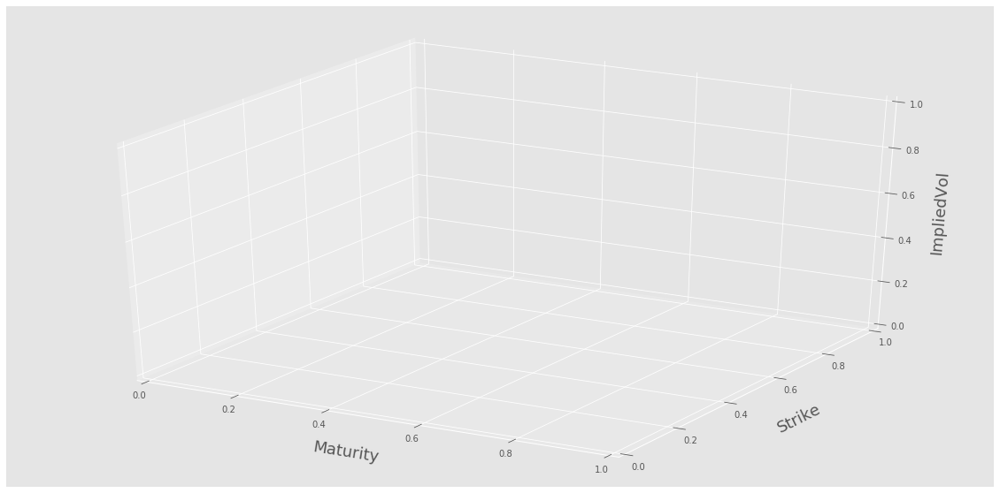

In [11]:
plotTools.plotSerie(getCall(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

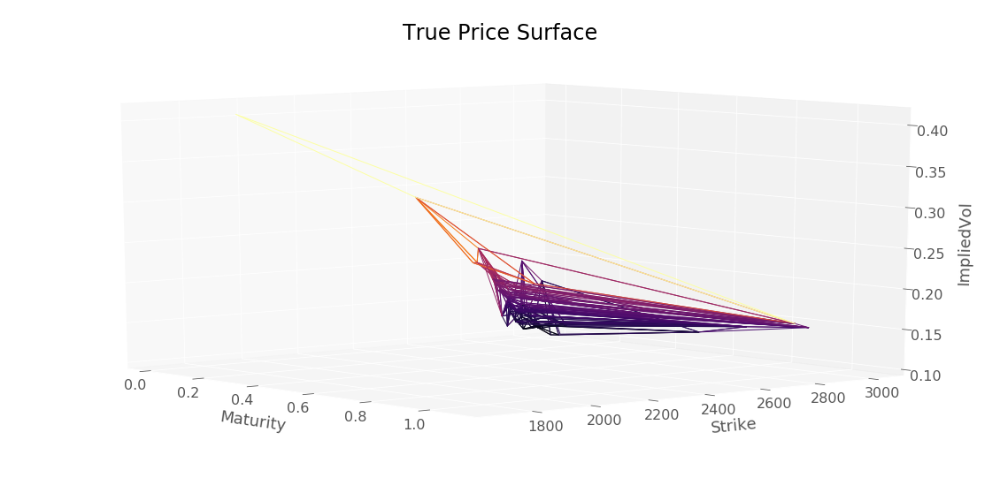

In [11]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

ValueError: x and y arrays must have a length of at least 3

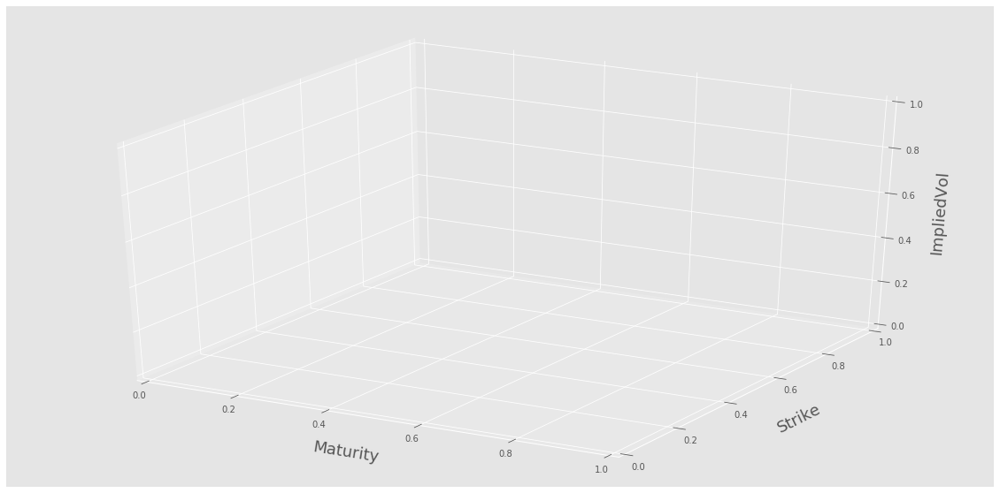

In [12]:
plotTools.plotSerie(getCall(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

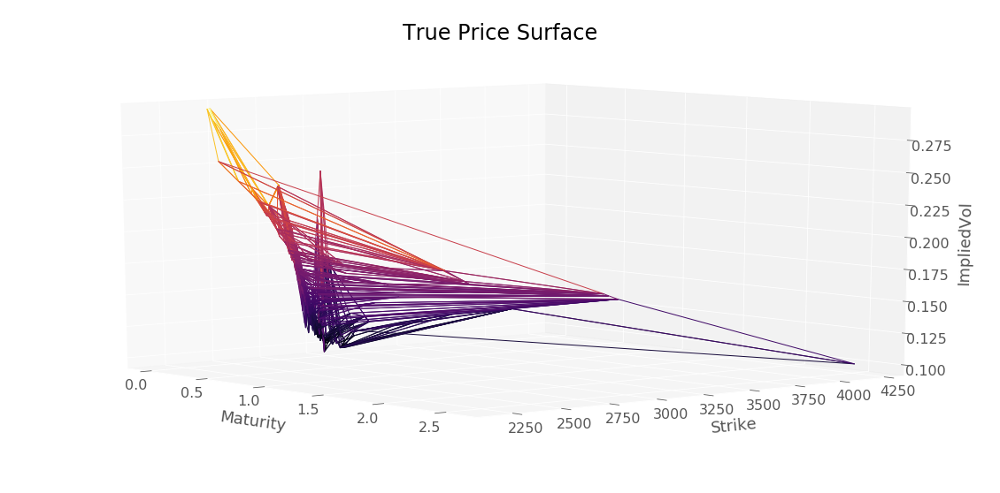

In [12]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

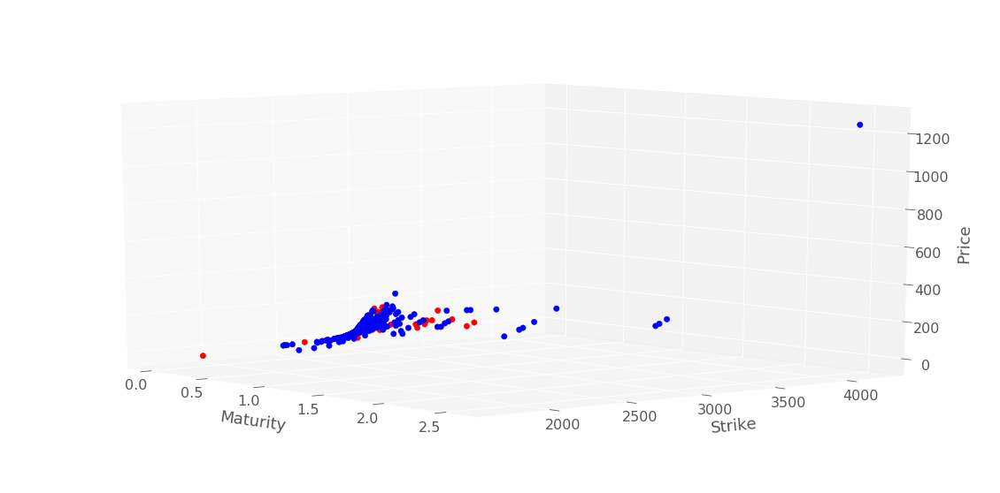

In [13]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

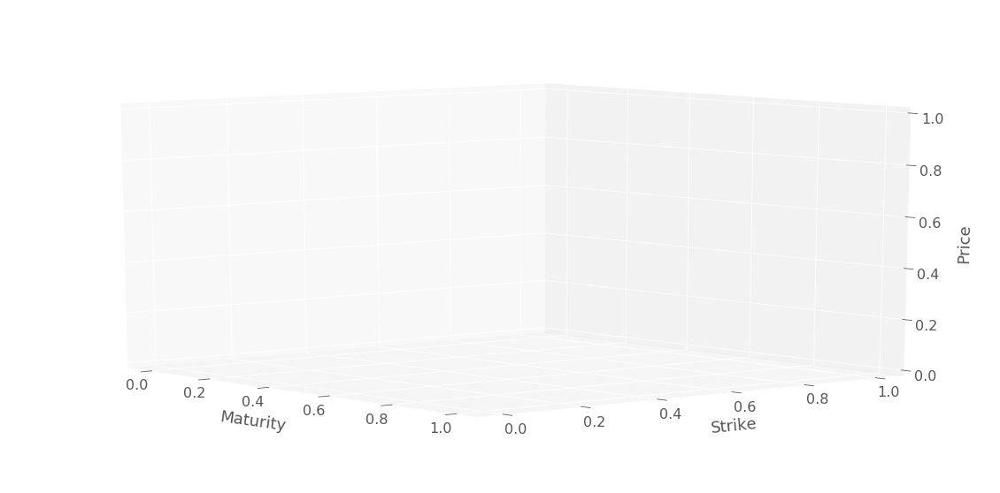

In [14]:
plotTools.plot2Series(getCall(testingSet)["Price"], 
                      getCall(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0,
                      Title = 'True Price Surface')

In [14]:
testingSet.shape

(439, 15)

In [15]:
trainingSet.shape

(111, 15)

In [16]:
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
1700.0,0.246,0.80,-0.004171,17.445534,0.009788,-0.000018,15.329284,1697.643924,0.997527,1700.0,0.246,0.4147,0.062925,-1.0,-0.521416,0.042306
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-0.000055,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013
2600.0,0.170,15.05,-0.122026,238.644663,0.208757,0.000231,336.543352,2596.728694,0.999189,2600.0,0.170,0.2084,289.051739,-1.0,-0.096405,0.007383
2650.0,0.342,41.20,-0.220872,496.273424,0.397022,0.000592,344.686117,2644.682062,0.995921,2650.0,0.342,0.1869,554.780353,-1.0,-0.078106,0.011947
2750.0,0.036,7.95,-0.145388,123.883524,0.233300,0.000651,819.065146,2749.142081,1.000312,2750.0,0.036,0.2000,150.351291,-1.0,-0.039368,0.001440


## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

In [17]:
activateScaling = False
transformCustom = dataSetConstruction.transformCustomMinMax if activateScaling else dataSetConstruction.transformCustomId
inverseTransform = dataSetConstruction.inverseTransformMinMax if activateScaling else dataSetConstruction.inverseTransformId
inverseTransformColumn = dataSetConstruction.inverseTransformColumnMinMax if activateScaling else dataSetConstruction.inverseTransformColumnId
inverseTransformColumnGreeks = dataSetConstruction.inverseTransformColumnGreeksMinMax if activateScaling else dataSetConstruction.inverseTransformColumnGreeksId

In [18]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)
scaledDataSetTest = transformCustom(dataSetTest, scaler)

In [19]:
scaledDataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
1700.0,0.246,0.80,-0.004171,17.445534,0.009788,-0.000018,15.329284,1697.643924,0.997527,1700.0,0.246,0.4147,0.062925,-1.0,-0.521416,0.042306
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-0.000055,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013
2600.0,0.170,15.05,-0.122026,238.644663,0.208757,0.000231,336.543352,2596.728694,0.999189,2600.0,0.170,0.2084,289.051739,-1.0,-0.096405,0.007383
2650.0,0.342,41.20,-0.220872,496.273424,0.397022,0.000592,344.686117,2644.682062,0.995921,2650.0,0.342,0.1869,554.780353,-1.0,-0.078106,0.011947
2750.0,0.036,7.95,-0.145388,123.883524,0.233300,0.000651,819.065146,2749.142081,1.000312,2750.0,0.036,0.2000,150.351291,-1.0,-0.039368,0.001440


In [20]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

## Plot functions

In [21]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


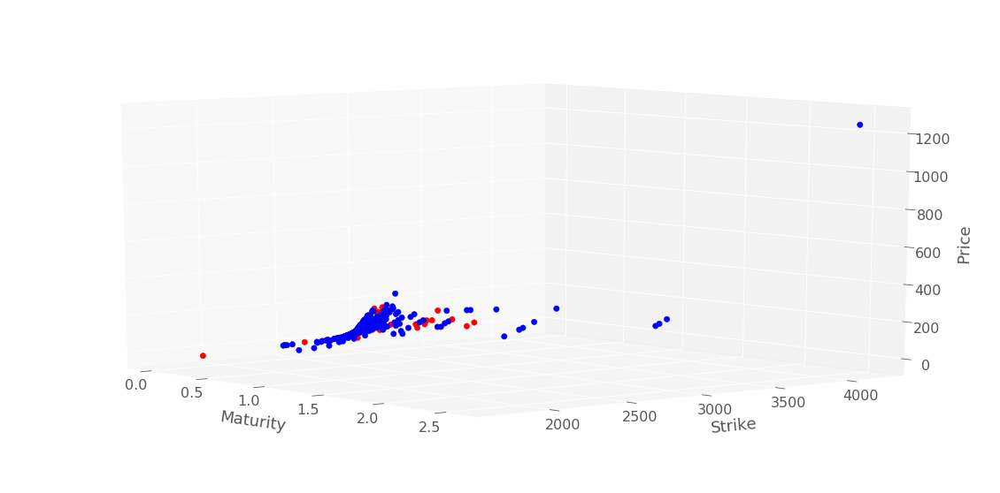

In [22]:
plotTools.plot2Series(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                      dataSet[dataSet.Maturity > 0]["Price"], 
                      yMin=KMin,
                      yMax=KMax, 
                      Title = 'True Price Surface')

In [23]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

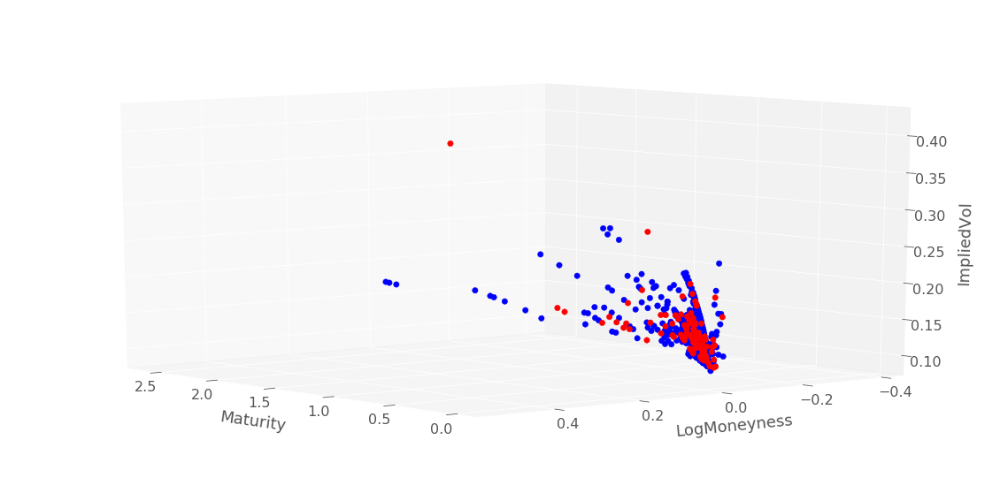

In [24]:
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[dataSetTest.Maturity > 0], S0)["ImpliedVol"], 
                      plotTools.convertToLogMoneyness(dataSet[dataSet.Maturity > 0], S0)["ImpliedVol"], 
                      yMin=-1000,
                      yMax=1000, 
                      Title = 'True Implied vol Surfaces', 
                      az=140)

In [25]:
plt.get_cmap("plasma")(0)

(0.050383, 0.029803, 0.527975, 1.0)

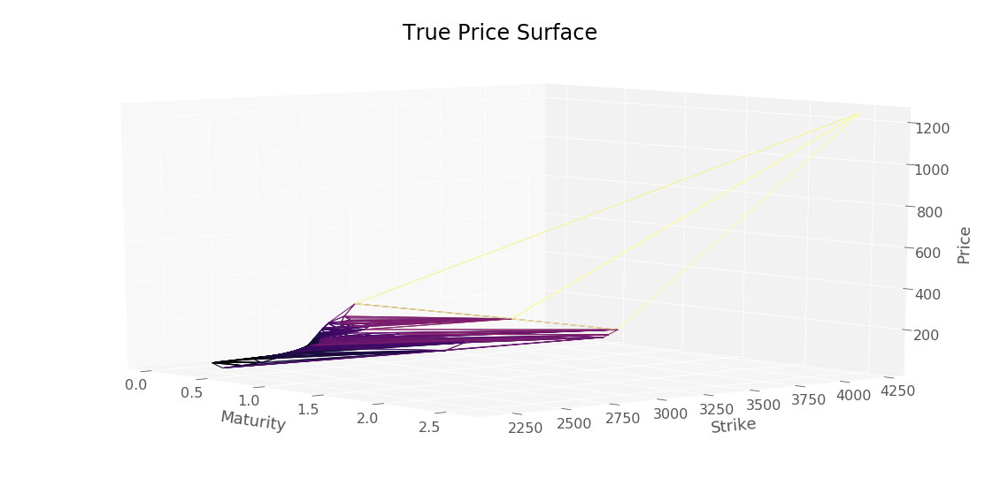

In [26]:
plotTools.plotSerie(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

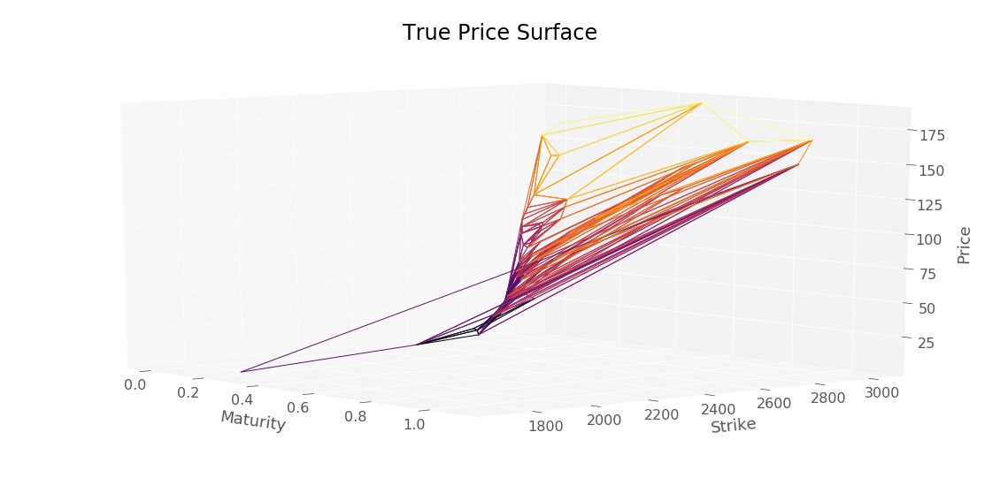

In [27]:
plotTools.plotSerie(dataSet["Price"],
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

In [28]:
inverseTransform(scaledDataSet, scaler).head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
1700.0,0.246,0.80,-0.004171,17.445534,0.009788,-0.000018,15.329284,1697.643924,0.997527,1700.0,0.246,0.4147,0.062925,-1.0,-0.521416,0.042306
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-0.000055,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013
2600.0,0.170,15.05,-0.122026,238.644663,0.208757,0.000231,336.543352,2596.728694,0.999189,2600.0,0.170,0.2084,289.051739,-1.0,-0.096405,0.007383
2650.0,0.342,41.20,-0.220872,496.273424,0.397022,0.000592,344.686117,2644.682062,0.995921,2650.0,0.342,0.1869,554.780353,-1.0,-0.078106,0.011947
2750.0,0.036,7.95,-0.145388,123.883524,0.233300,0.000651,819.065146,2749.142081,1.000312,2750.0,0.036,0.2000,150.351291,-1.0,-0.039368,0.001440


### Implied volatility function calibration by bissection

Strike :  2820.0  NbViolations :  1
0.074     True
0.246    False
dtype: bool
0.055    0.000886
0.074    0.000396
0.246    0.003997
dtype: float64
Strike :  2825.0  NbViolations :  1
0.055    True
dtype: bool
0.036    0.000461
0.055    0.000408
dtype: float64
Strike :  2830.0  NbViolations :  1
0.093    True
dtype: bool
0.093    0.001655
0.093    0.000000
dtype: float64
Strike :  2850.0  NbViolations :  1
0.591    False
0.668     True
1.090    False
dtype: bool
0.112    0.001186
0.591    0.011014
0.668    0.001774
1.090    0.011671
dtype: float64
Strike :  2855.0  NbViolations :  1
0.093    True
dtype: bool
0.093    0.000889
0.093    0.000000
dtype: float64
Strike :  2870.0  NbViolations :  1
0.082     True
0.151    False
0.246    False
dtype: bool
0.063    0.000575
0.082    0.000321
0.151    0.001482
0.246    0.001956
dtype: float64
Strike :  2875.0  NbViolations :  2
0.074     True
0.170    False
0.170     True
0.342    False
dtype: bool
0.036    0.000665
0.074    0.000646
0.170    0

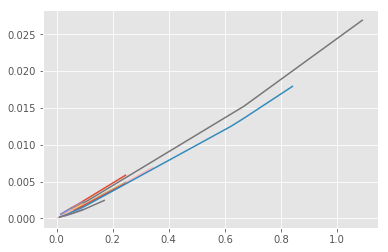

In [41]:
for strike in dataSet.rename({"Strike" : "StrikeColumn"}, axis=1).groupby("StrikeColumn"):
    impliedTotVariance = np.square(strike[1]["ImpliedVol"]) * strike[1]["Maturity"]
    sortedStrike = pd.Series(impliedTotVariance.values, 
                             index  = strike[1]["Maturity"].values).sort_index().diff().dropna()
    thetaViolation = sortedStrike.diff().dropna()
    if (thetaViolation < 0).sum() > 0 :
        plt.plot(strike[1]["Maturity"].values, impliedTotVariance.values, label = str(strike[0]))
        print("Strike : ", strike[0], " NbViolations : ", (thetaViolation < 0).sum())
        print((thetaViolation < 0))
        print(sortedStrike)

In [31]:
%matplotlib inline

In [44]:
360 * 0.093

33.48

# SSVI Model

In [32]:
import SSVI


In [33]:
np.seterr(all='warn')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [34]:
dataSet = dataSet[dataSet["Maturity"] > 0]
dataSetTest = dataSetTest[dataSetTest["Maturity"] > 0]


In [35]:
dataSet.columns

Index(['Price', 'Delta', 'Vega', 'Delta Strike', 'Gamma Strike', 'Theta',
       'ChangedStrike', 'DividendFactor', 'Strike', 'Maturity', 'ImpliedVol',
       'VegaRef', 'OptionType', 'logMoneyness', 'impliedTotalVariance'],
      dtype='object')

In [36]:
importlib.reload(SSVI)

<module 'SSVI' from './code/SSVI.py'>

In [37]:
#parameters, theta, maturities, pSSVI = SSVI.train_svi_surface(dataSet, S0)
SSVIModel = SSVI.SSVIModel(S0, bootstrap)
SSVIModel.fit(dataSet)

/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/optimize/_constraints.py:301: OptimizeWarning: Constraint options `finite_diff_jac_sparsity`, `finite_diff_rel_step`, `keep_feasible`, and `hess`are ignored by this method.
  "are ignored by this method.", OptimizeWarning)


Parameters of SSVI model :  [-0.89319164  0.79797186  0.5       ]
time step 20  :  1.09


./code/SSVI.py:593: RuntimeWarning: invalid value encountered in sqrt
  alpha = np.sign(beta) * np.sqrt(1 / beta ** 2 - 1)
./code/SSVI.py:595: RuntimeWarning: invalid value encountered in sqrt
  (b * (-rho + np.sign(alpha) * np.sqrt(1 + alpha ** 2) - alpha * np.sqrt(1 - rho ** 2))))
./code/SSVI.py:606: RuntimeWarning: invalid value encountered in sqrt
  a = vt * tau - b * sigma * np.sqrt(1 - rho ** 2)
./code/SSVI.py:290: RuntimeWarning: invalid value encountered in less
  if not isempty(slice_before) and any(model_total_implied_variance < slice_before):
./code/SSVI.py:305: RuntimeWarning: invalid value encountered in less
  if any(model_total_implied_variance < before_total_implied_variance) :


time step 19  :  0.871


./code/SSVI.py:293: RuntimeWarning: invalid value encountered in greater
  if not isempty(slice_after) and any(model_total_implied_variance > slice_after):
./code/SSVI.py:310: RuntimeWarning: invalid value encountered in greater
  if any(model_total_implied_variance > after_total_implied_variance) :


time step 18  :  0.668
time step 17  :  0.591
time step 16  :  0.342
time step 15  :  0.17
time step 14  :  0.151
time step 13  :  0.112
time step 12  :  0.093
time step 11  :  0.082
time step 10  :  0.074
time step 9  :  0.063
time step 8  :  0.055
time step 7  :  0.049
time step 6  :  0.044
time step 5  :  0.036
time step 4  :  0.03
time step 3  :  0.027
time step 2  :  0.016
time step 1  :  0.011
time step 0  :  0.005


In [38]:
serie = SSVIModel.eval(dataSetTest)

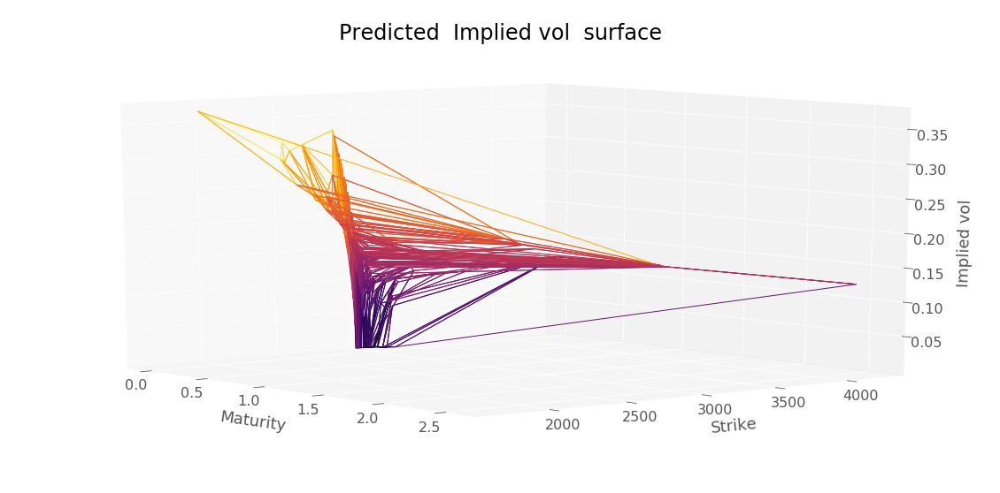

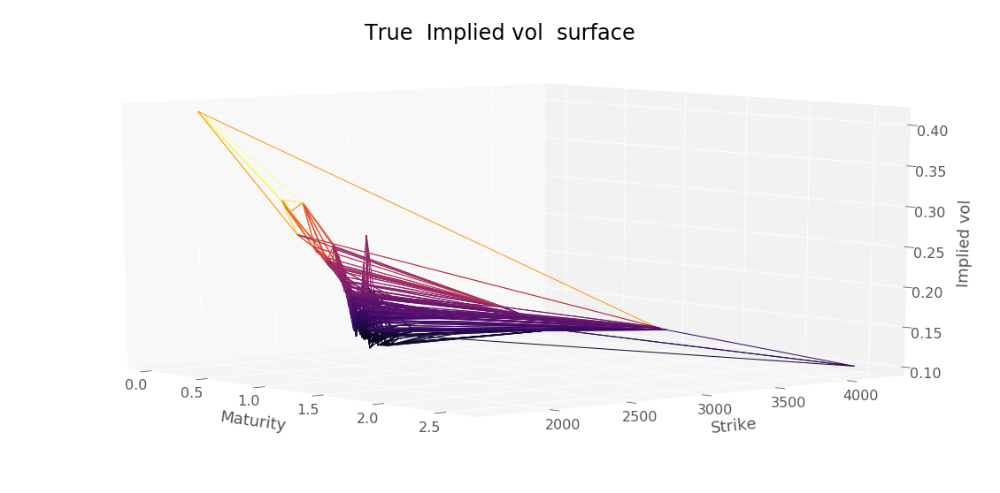

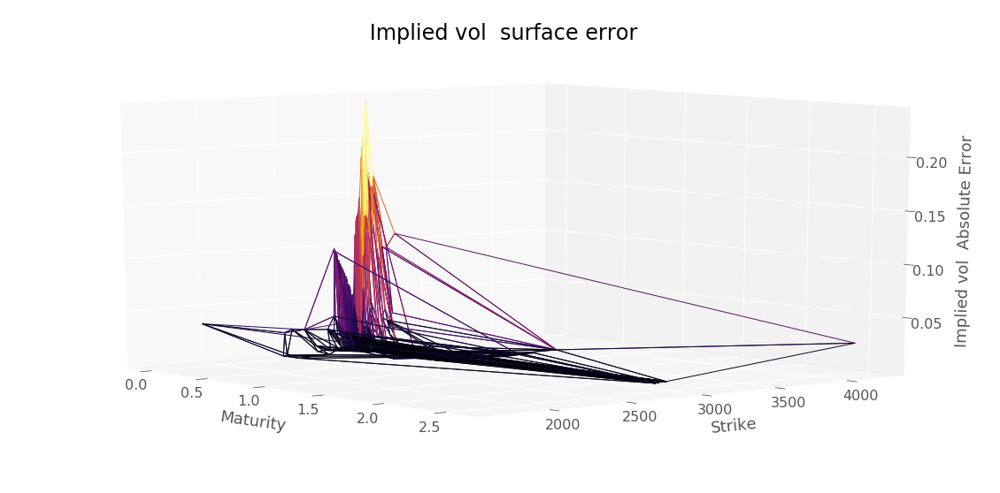

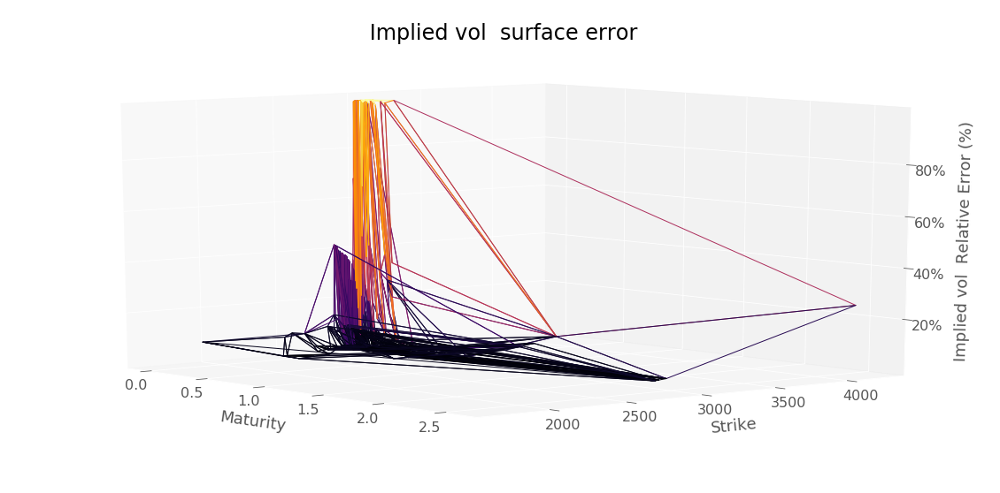

RMSE :  0.04229449768028018


In [39]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

In [37]:
SSVIModel.theta

array([0.00011049, 0.00026763, 0.00044854, 0.00055564, 0.00064881,
       0.00083375, 0.00102945, 0.00118048, 0.00124875, 0.00151781,
       0.00185678, 0.00230862, 0.00350265, 0.00408043, 0.00501385,
       0.00711798, 0.00866636, 0.01292643, 0.01894133])

In [38]:
SSVIModel.maturities

array([0.005, 0.011, 0.016, 0.027, 0.03 , 0.036, 0.049, 0.055, 0.063,
       0.074, 0.093, 0.112, 0.17 , 0.203, 0.246, 0.342, 0.419, 0.591,
       0.841])

In [39]:
SSVIModel.forward_theta

array([2859.53    , 2859.821655, 2860.084212, 2860.345112, 2860.444539,
       2860.422368, 2860.533569, 2860.210563, 2860.476603, 2860.208688,
       2861.029305, 2861.815909, 2863.132548, 2864.728347, 2863.499797,
       2865.28817 , 2866.668643, 2868.774184, 2873.400483])

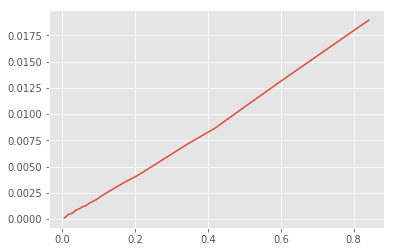

In [40]:
plt.plot(SSVIModel.maturities, SSVIModel.theta)#np.sqrt(theta/maturities))#theta)

In [41]:

serieDf = SSVIModel.eval(dataSetTest)

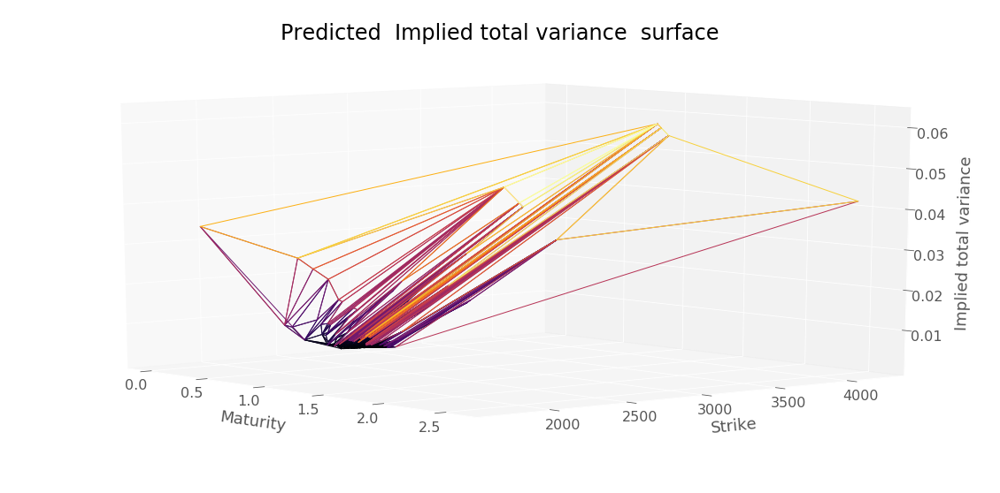

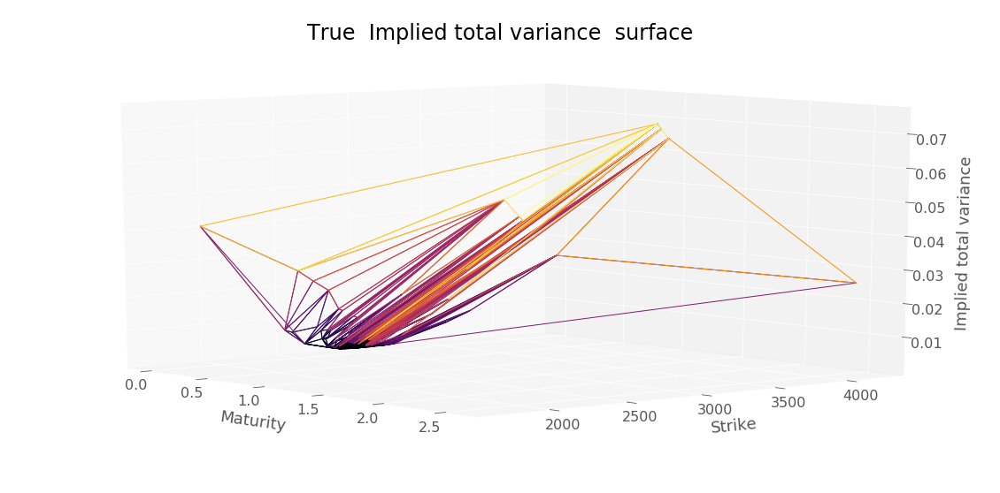

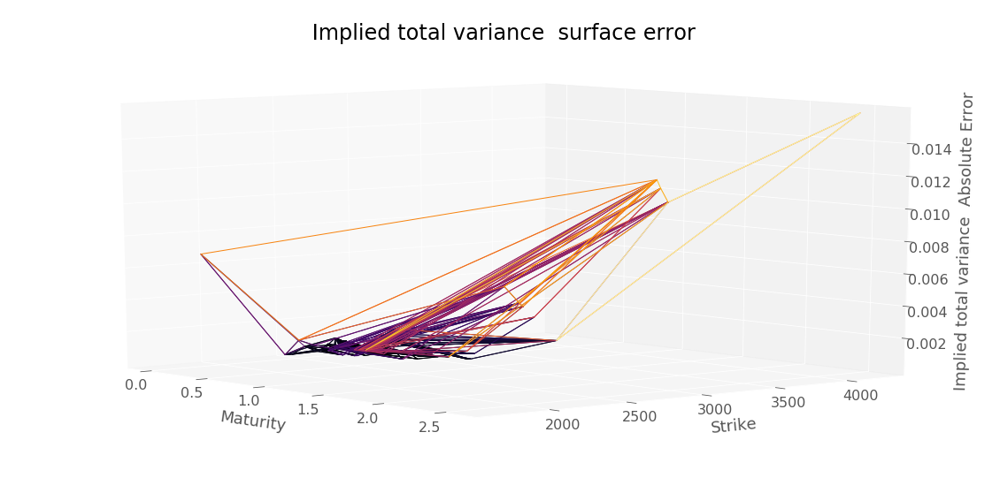

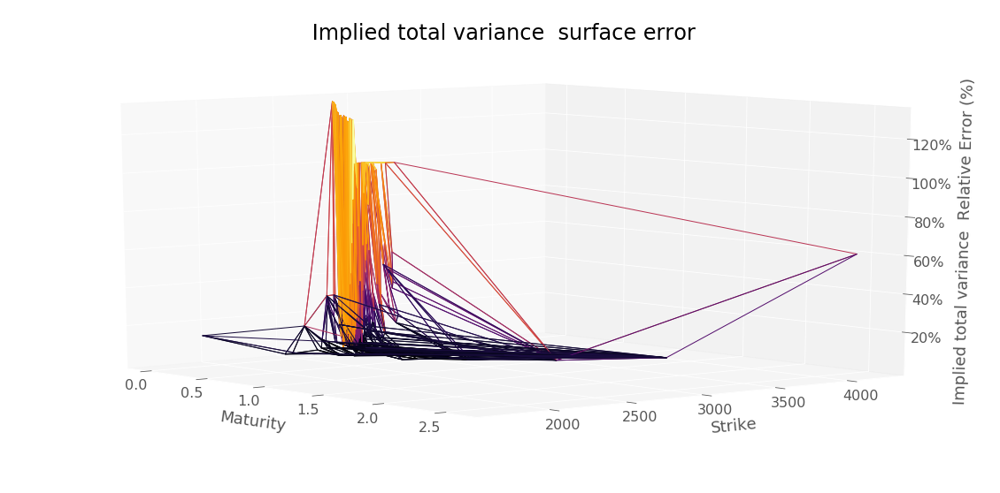

RMSE :  0.0013855995417386504


In [42]:
plotTools.predictionDiagnosis(SSVI.impliedVariance(serieDf), 
                              SSVI.impliedVariance(dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"]), 
                              " Implied total variance ", 
                              yMin=KMin, 
                              yMax=KMax)

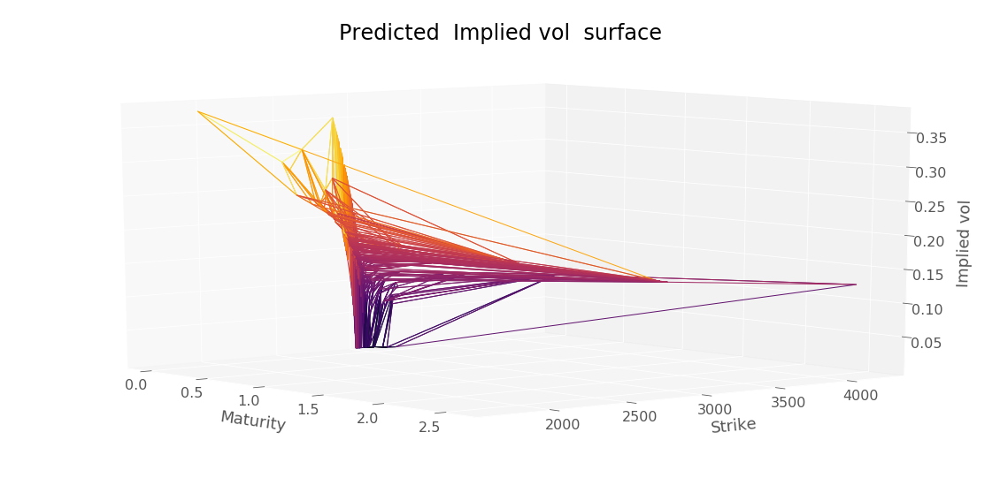

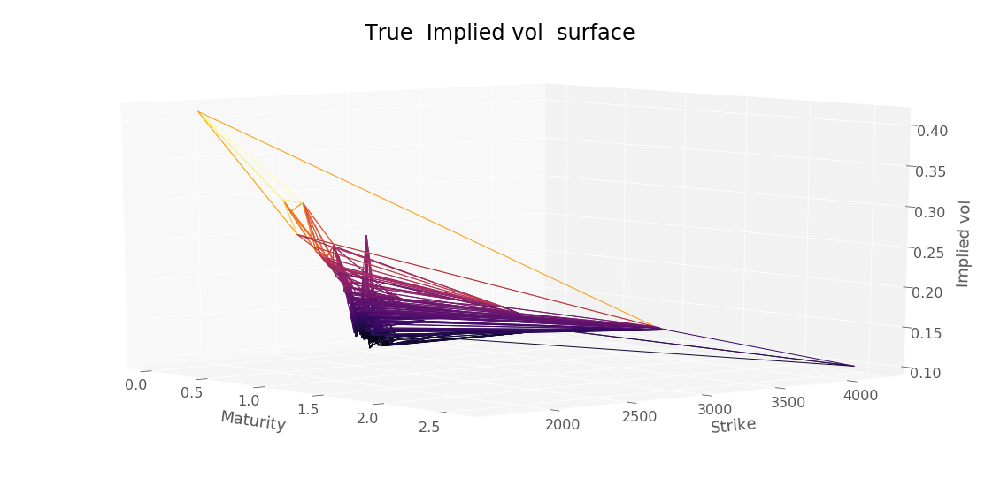

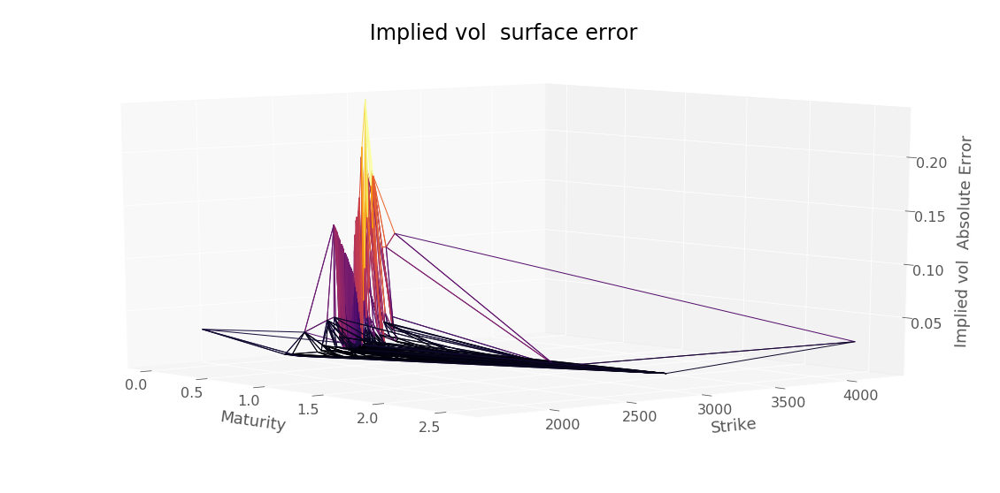

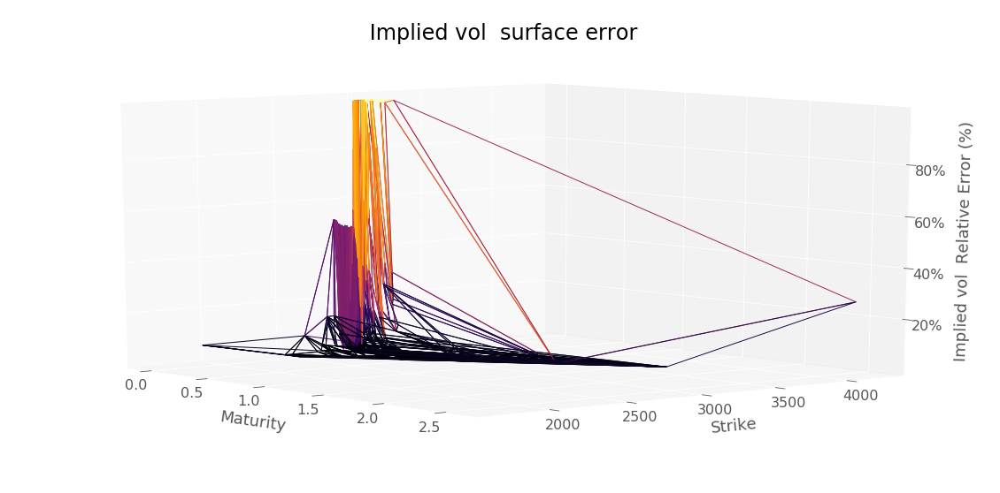

RMSE :  0.04445448562265577


In [43]:
plotTools.predictionDiagnosis(serieDf, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin, 
                              yMax=KMax)

In [44]:
dataSet.head(20)

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
2325.0 0.112      1.65 -0.015858   38.013421      0.027412     -0.000040   
2350.0 0.112      1.85 -0.018041   42.445064      0.030966     -0.000041   
2550.0 0.112      6.25 -0.063439  119.069204      0.105505      0.000026   
2650.0 0.170     19.90 -0.160133  287.023751      0.274635      0.000421   
2700.0 0.170     26.40 -0.210447  340.218379      0.363626      0.000726   
       0.170     26.70 -0.210447  340.218379      0.363626      0.000726   
2715.0 0.112     19.55 -0.192793  262.024317      0.325990      0.000731   
2745.0 0.093     20.05 -0.218509  257.197875      0.369026      0.001025   
2750.0 0.036      7.95 -0.145388  123.883524      0.233300      0.000651   
       0.093     20.30 -0.225090  261.594710      0.380580      0.001095   
2760.0 0.016      4.00 -0.101115   63.994172      0.156512      0.000355   
2765.0 0.093     23.45 -0.252686  278.683899      0.430775      0.001360   
2770.0 0.016      4.80 -0.120224   72.450880      0.187672      0.000565   
2775.0 0.016      5.30 -0.131569   77.153964      0.206412      0.000702   
2780.0 0.005      0.45 -0.023692   11.296022      0.033688     -0.000217   
       0.016      5.80 -0.143188   81.744594      0.225742      0.000856   
2795.0 0.055     20.10 -0.278656  225.218886      0.472588      0.002056   
2800.0 0.005      1.10 -0.057714   23.363466      0.084626      0.000006   
       0.036     15.30 -0.261243  176.419337      0.436872      0.002157   
       0.093     30.80 -0.324325  313.592138      0.564818      0.002185   

                       Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                 
2325.0 0.112       73.269010    2323.142879        1.000112  2325.0     0.112   
2350.0 0.112       82.136423    2348.122910        1.000112  2350.0     0.112   
2550.0 0.112      246.324369    2547.963157        1.000112  2550.0     0.112   
2650.0 0.170      404.992708    2646.665627        0.999179  2650.0     0.170   
2700.0 0.170      472.921646    2696.602714        0.999179  2700.0     0.170   
       0.170      472.921646    2696.602714        0.999179  2700.0     0.170   
2715.0 0.112      555.684313    2712.831362        1.000112  2715.0     0.112   
2745.0 0.093      648.453731    2743.561499        1.000292  2745.0     0.093   
2750.0 0.036      819.065146    2749.142081        1.000312  2750.0     0.036   
       0.093      655.305610    2748.558879        1.000292  2750.0     0.093   
2760.0 0.016      950.018217    2759.465182        1.000194  2760.0     0.016   
2765.0 0.093      686.362498    2763.551018        1.000292  2765.0     0.093   
2770.0 0.016     1084.931253    2769.463244        1.000194  2770.0     0.016   
2775.0 0.016     1160.452150    2774.462275        1.000194  2775.0     0.016   
2780.0 0.005      454.839325    2780.000000        1.000000  2780.0     0.005   
       0.016     1232.450152    2779.461306        1.000194  2780.0     0.016   
2795.0 0.055      919.158731    2794.334953        1.000238  2795.0     0.055   
2800.0 0.005     1011.450981    2800.000000        1.000000  2800.0     0.005   
       0.036     1121.117684    2799.126482        1.000312  2800.0     0.036   
       0.093      706.064014    2798.532677        1.000292  2800.0     0.093   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
2325.0 0.112         0.2958   15.762710        -1.0     -0.207736   
2350.0 0.112         0.2875   21.589866        -1.0     -0.197041   
2550.0 0.112         0.2317  139.166837        -1.0     -0.115363   
2650.0 0.170         0.1968  341.001427        -1.0     -0.077357   
2700.0 0.170         0.1856  387.951765        -1.0     -0.058665   
       0.170         0.1856  387.951765        -1.0     -0.058665   
2715.0 0.

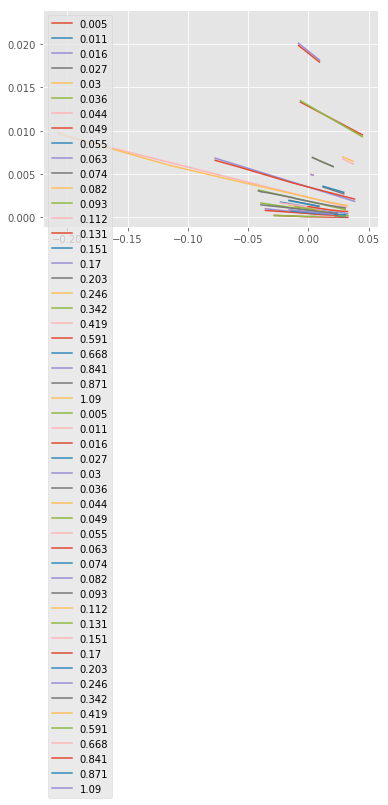

In [45]:
#interpolationBind = lambda x : SSVI.interpolateGrid(x, parameters, 
#                                                    theta, 
#                                                    maturities, 
#                                                    interestrate_theta,
#                                                    forward_theta,
#                                                    S0,
#                                                    bootstrap)
interpolationBind = lambda x : SSVIModel.eval(x)
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plotTools.plotEachSmile(dataSet)
plt.show()

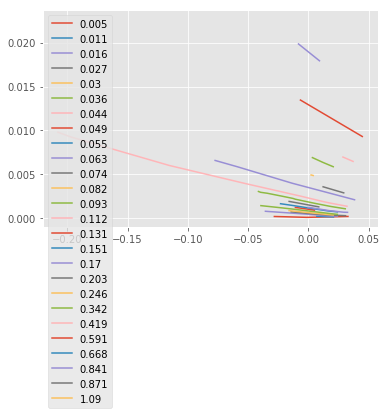

In [46]:
plotTools.plotEachSmile(dataSet)
plt.show()

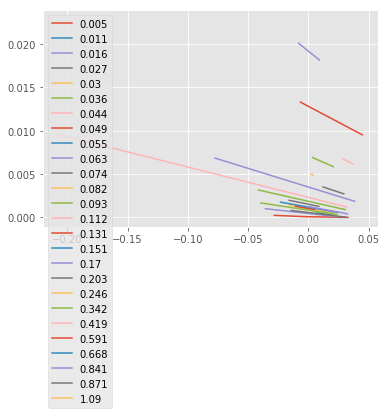

In [47]:
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plt.show()

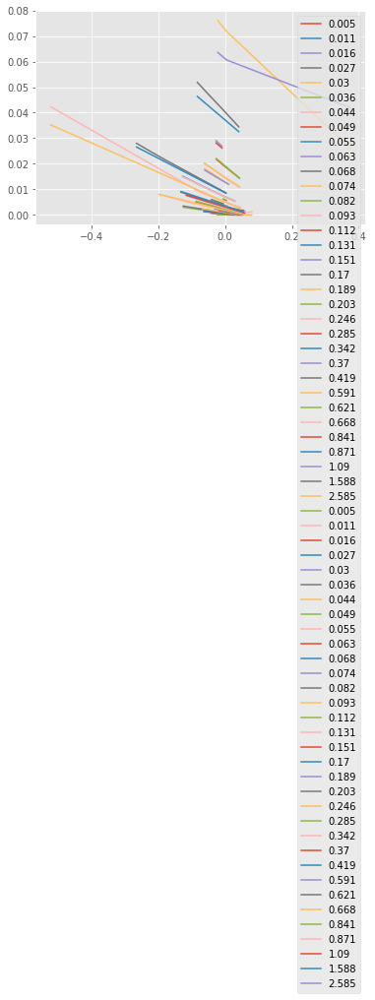

In [48]:
plotTools.plotEachSmile(dataSetTest)
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

In [49]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

In [50]:
s = dataSet[dataSet["Strike"]<=3000]["Strike"].max()
s

3000.0

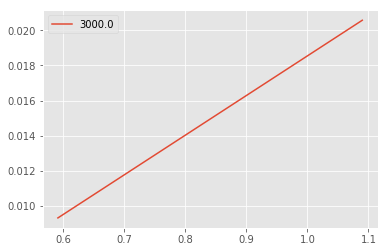

In [51]:
plotTools.plotEachStrike(dataSet[dataSet["Strike"]==s])

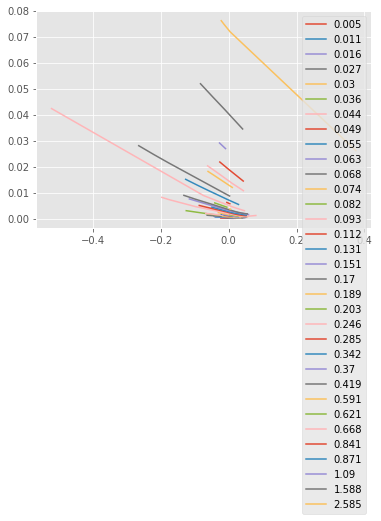

In [52]:
plotTools.plotEachSmile(dataSetTest)
plt.show()

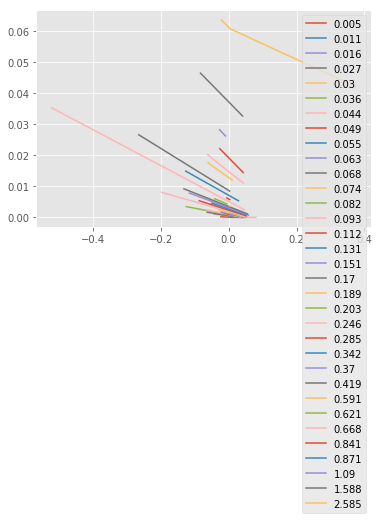

In [53]:
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

In [54]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSet, interpolationBind)

./code/SSVI.py:1056: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


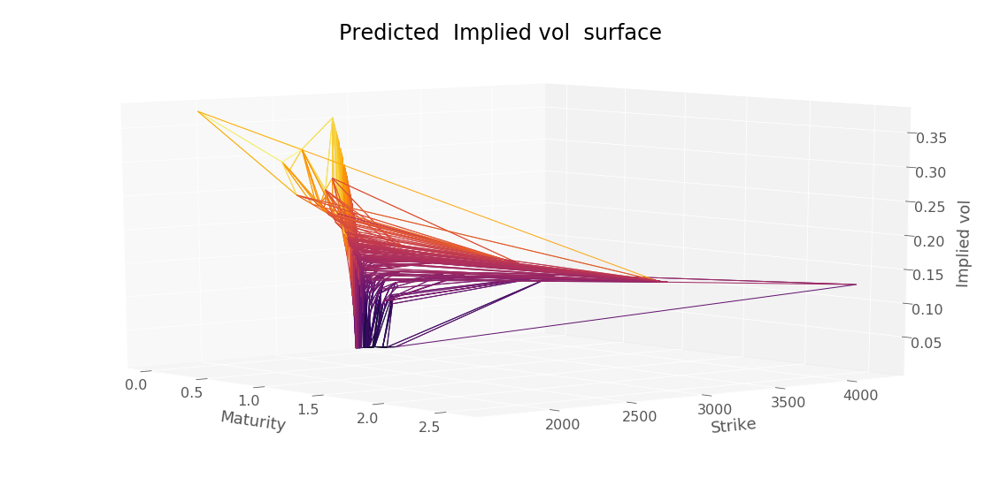

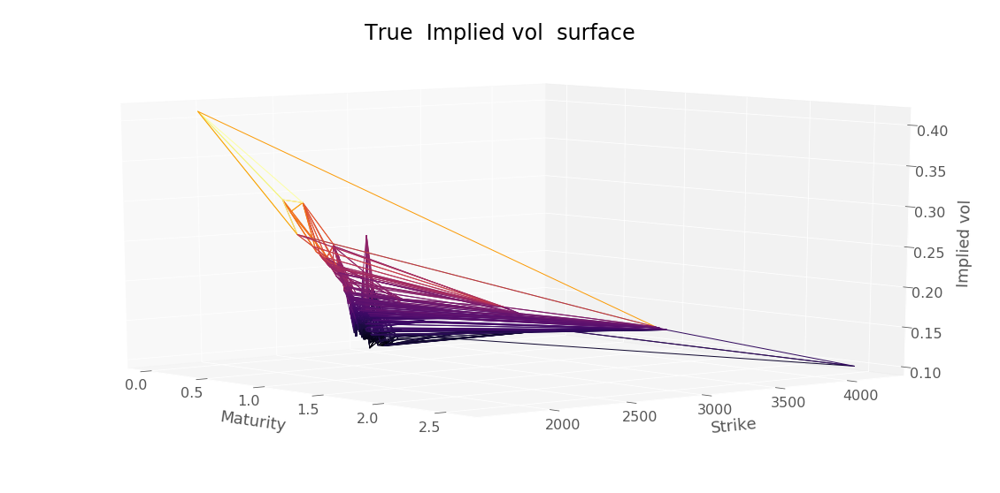

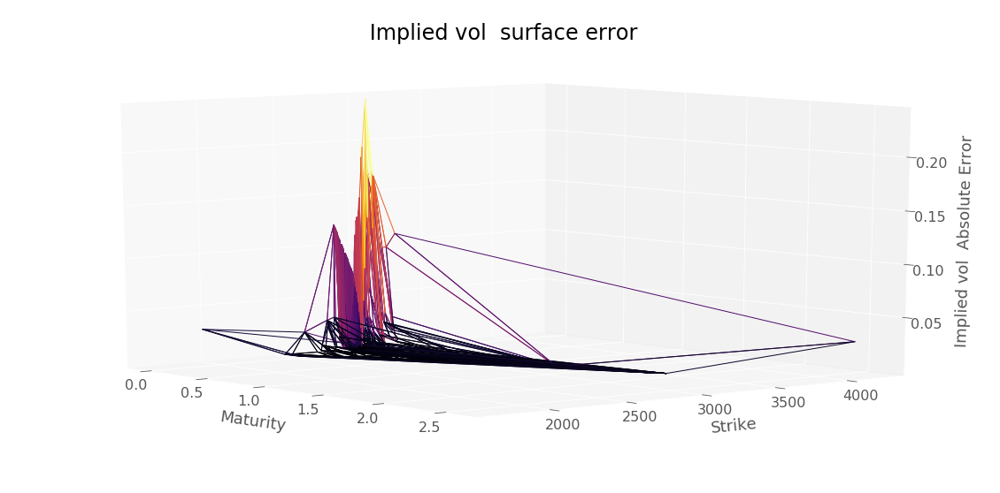

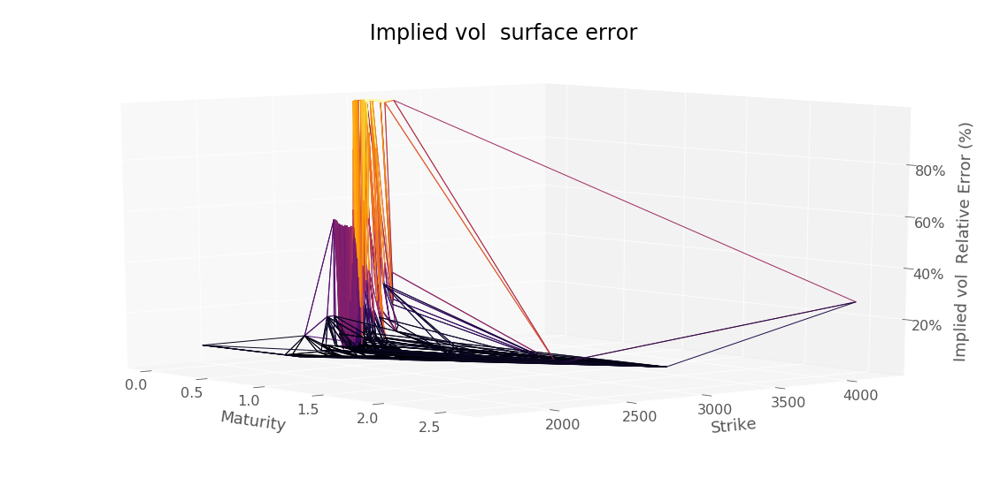

RMSE :  0.04445448562265577


In [55]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest["ImpliedVol"], 
                              " Implied vol ",
                              yMin=KMin, 
                              yMax=KMax)

In [56]:
dataSet["Maturity"]

Strike  Maturity
2325.0  0.112       0.112
2350.0  0.112       0.112
2550.0  0.112       0.112
2650.0  0.170       0.170
2700.0  0.170       0.170
        0.170       0.170
2715.0  0.112       0.112
2745.0  0.093       0.093
2750.0  0.036       0.036
        0.093       0.093
2760.0  0.016       0.016
2765.0  0.093       0.093
2770.0  0.016       0.016
2775.0  0.016       0.016
2780.0  0.005       0.005
        0.016       0.016
2795.0  0.055       0.055
2800.0  0.005       0.005
        0.036       0.036
        0.093       0.093
        0.871       0.871
2805.0  0.036       0.036
2810.0  0.016       0.016
2815.0  0.005       0.005
        0.030       0.030
        0.055       0.055
        0.074       0.074
2820.0  0.027       0.027
        0.030       0.030
2825.0  0.055       0.055
                    ...  
2900.0  0.342       0.342
        0.841       0.841
2905.0  0.016       0.016
2910.0  0.036       0.036
        0.055       0.055
        0.063       0.063
        0.093       0

In [57]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

Number of arbitrage violations :  19
Arbitrable volatility :  Strike  Maturity
2750.0  0.036       0.2000
2760.0  0.016       0.2233
2770.0  0.016       0.2181
2775.0  0.016       0.2160
2780.0  0.016       0.2133
2800.0  0.036       0.1808
2805.0  0.036       0.1784
2810.0  0.016       0.1979
2830.0  0.036       0.1677
2835.0  0.036       0.1653
2845.0  0.036       0.1601
2850.0  0.016       0.1743
2900.0  0.016       0.1372
2905.0  0.016       0.1336
2910.0  0.036       0.1237
2920.0  0.016       0.1280
2930.0  0.016       0.1259
        0.036       0.1119
2955.0  0.005       0.2047
Name: ImpliedVol, dtype: float64
Interpolated Arbitrable volatility :  Strike  Maturity
2750.0  0.036       0.214894
2760.0  0.016       0.249825
2770.0  0.016       0.242739
2775.0  0.016       0.239126
2780.0  0.016       0.235465
2800.0  0.036       0.188795
2805.0  0.036       0.186012
2810.0  0.016       0.212331
2830.0  0.036       0.171499
2835.0  0.036       0.168463
2845.0  0.036       0.162237
2

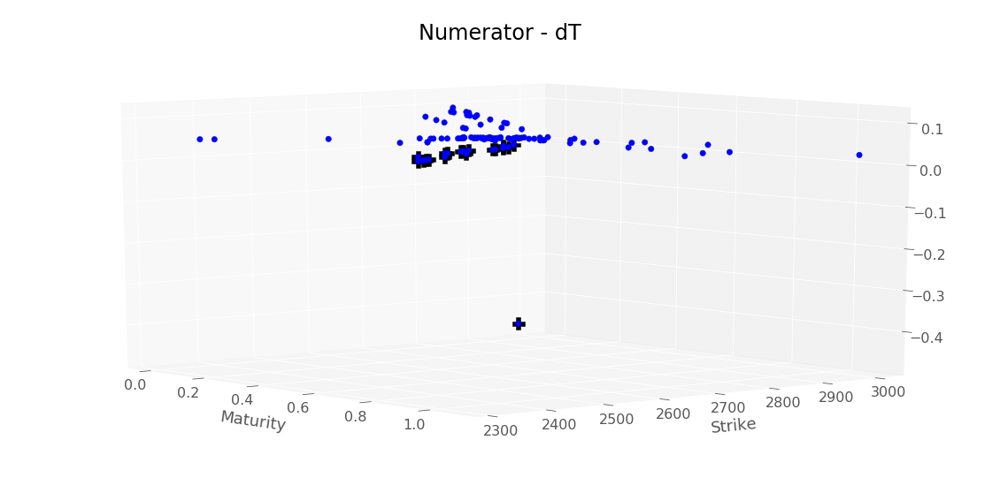

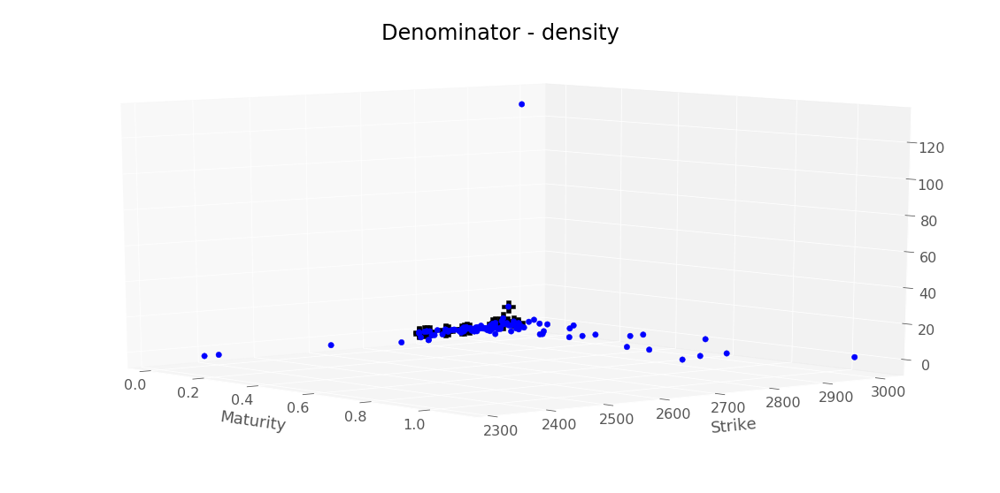

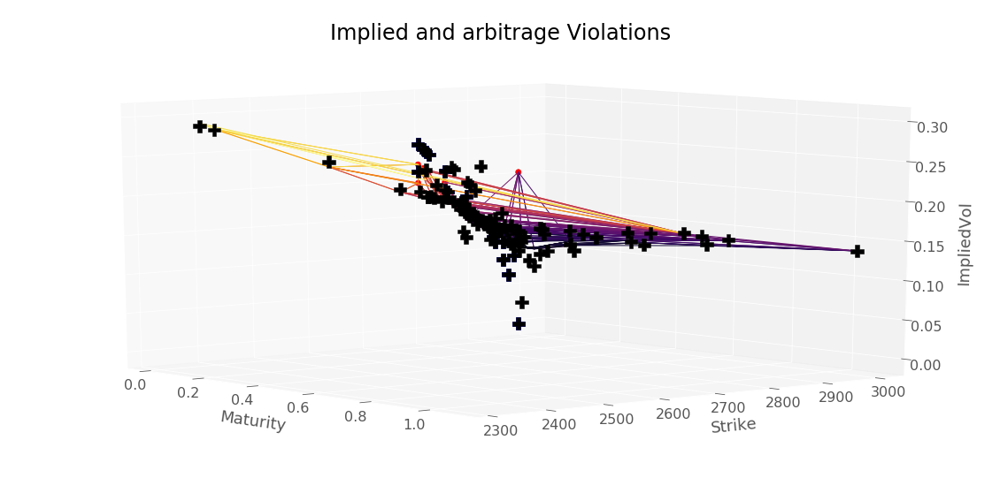

/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


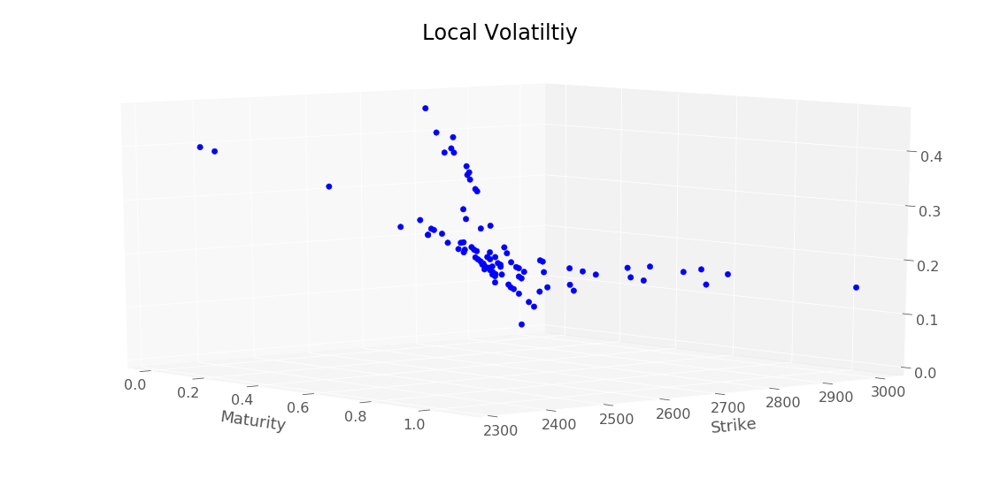

In [58]:
plotTools.diagnoseLocalVol(dT,
                           locVolSSVI,
                           density,
                           interpolationBind(dataSet),
                           dataSet,
                           az=320,
                           yMin=KMin,
                           yMax=KMax)

#### Evaluate local volatility on gp local volatility grid

In [98]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [99]:
kernel = "Matern" #"Gaussian"
workingFolder = "./data/09082001/"
locVolAreskyFormatted = loadData.loadGPLocVol(workingFolder, kernel, bootstrap, S0)

Loading local volatility from :  ./data/09082001/local_vol_matern_5_2.csv


In [109]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20          0.20  4171.929  0.200000         0.387651  
         0.24          0.24  4171.929  0.239895         0.405029  
         0.28          0.28  4171.929  0.279789         0.421496  
         0.32          0.32  4171.929  0.319684         0.432692  
         0.36          0.36  4171.929  0.359579         0.438045

In [110]:
locVolAreskyFormatted.shape

(171, 8)

In [111]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20          0.20  4171.929  0.200000         0.387651  
         0.24          0.24  4171.929  0.239895         0.405029  
         0.28          0.28  4171.929  0.279789         0.421496  
         0.32          0.32  4171.929  0.319684         0.432692  
         0.36          0.36  4171.929  0.359579         0.438045

In [112]:
locVolAreskyFormatted.drop_duplicates().shape

(171, 8)

In [113]:
locVolAreskyFormatted.index.unique().shape

(171,)

In [114]:
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(locVolAreskyFormatted, 
                                                           interpolationBind)

./code/SSVI.py:1019: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


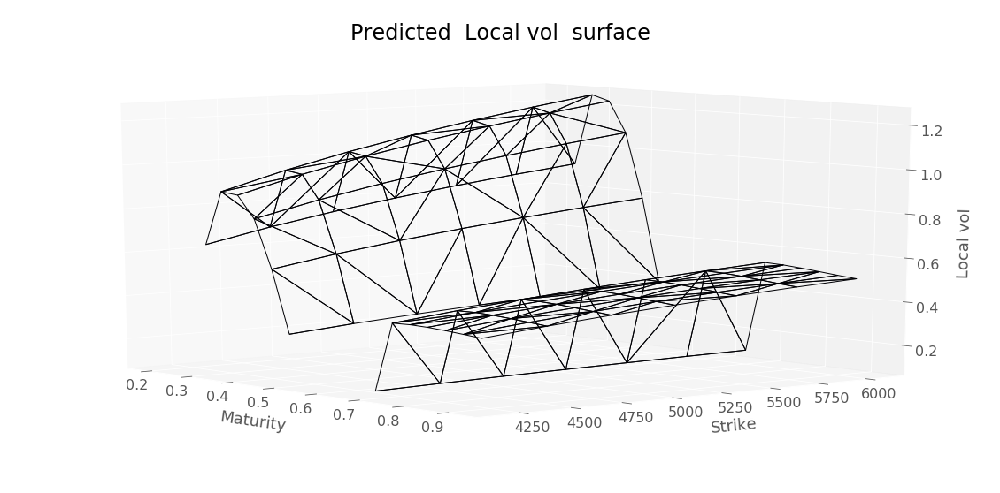

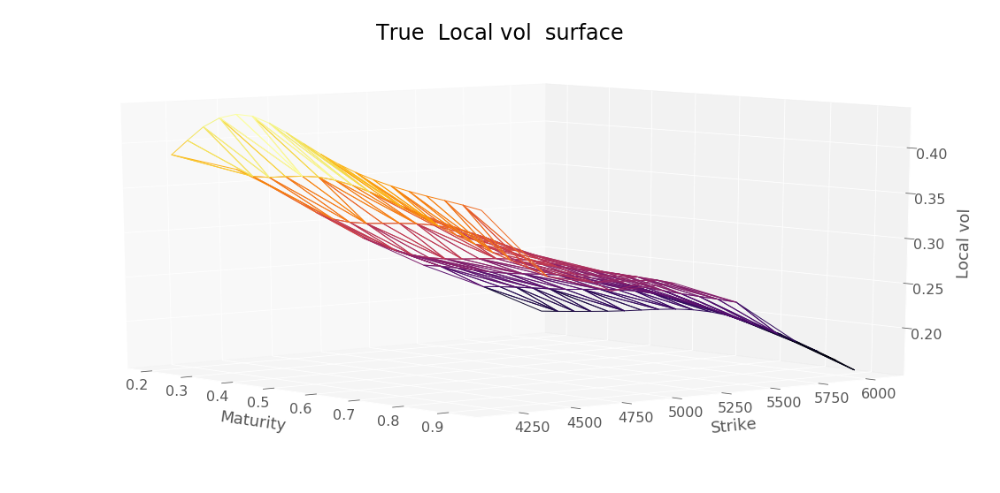

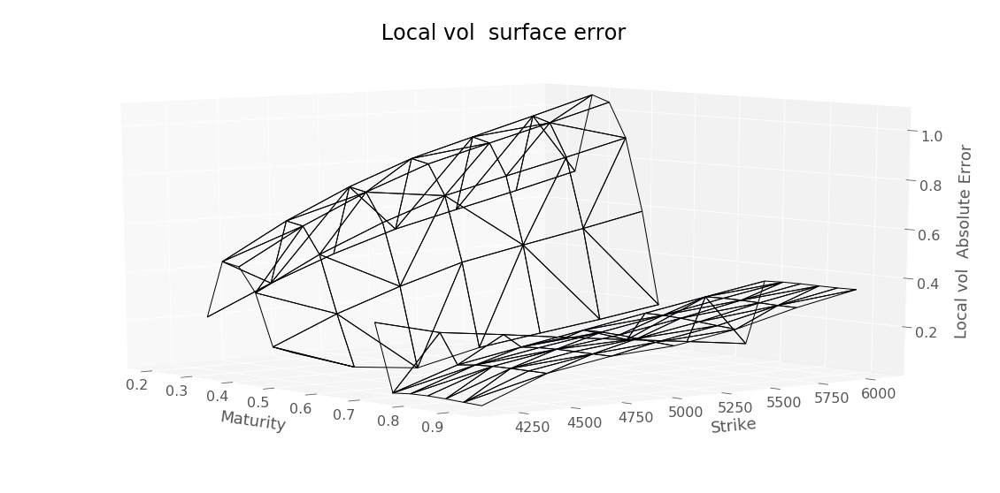

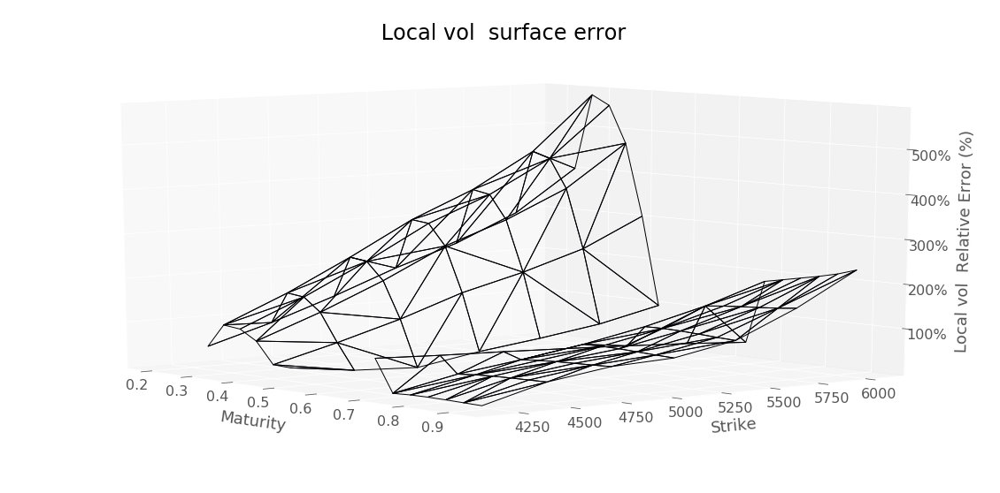

RMSE :  0.5020172106374904


In [115]:
plotTools.predictionDiagnosis(locVolSSVI, 
                              locVolAreskyFormatted["LocalVolatility"], 
                              " Local vol ", 
                              yMin=KMin,
                              yMax=KMax)

In [116]:
dataSet["Maturity"].unique()

array([0.942, 0.099, 0.175, 0.444, 1.441, 1.94 , 0.693, 0.268, 0.348])

In [117]:
#Maturity < 2
#K entr 70% et 130% de S0
#50 points pour le training set
#quasi-Aléatoire 

#Prix de call, taux zero coupon, puis parité call put

#Colonne mid, bid, ask, filtrer volume positif 

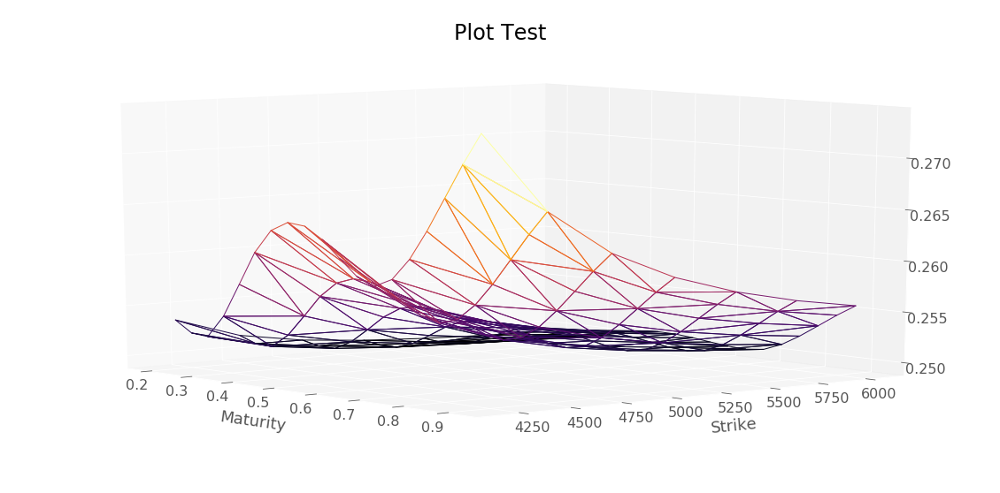

In [118]:
plotTools.plotSerie(density,
                    Title = 'Plot Test',
                    az=320,
                    yMin=KMin,
                    yMax=KMax)

In [119]:
locVolSSVIDf = locVolAreskyFormatted.copy(deep=True)
locVolSSVIDf["LocalVolatility"] = locVolSSVI

In [120]:
locVolSSVIDf.tail()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
6678.561 0.759           -1.0      0.811763    6913.792837  6678.561   
         0.798           -1.0      0.812381    6918.066551  6678.561   
         0.838           -1.0      0.812999    6922.343450  6678.561   
         0.878           -1.0      0.813616    6926.621146  6678.561   
         0.918           -1.0      0.814234    6930.899637  6678.561   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
6678.561 0.759        0.759  6678.561  0.758526         0.563982  
         0.798        0.798  6678.561  0.798421         0.556906  
         0.838        0.838  6678.561  0.838316         0.548042  
         0.878        0.878  6678.561  0.878211         0.539424  
         0.918        0.918  6678.561  0.918105         0.532265

In [122]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20          0.20  4171.929  0.200000         0.387651  
         0.24          0.24  4171.929  0.239895         0.405029  
         0.28          0.28  4171.929  0.279789         0.421496  
         0.32          0.32  4171.929  0.319684         0.432692  
         0.36          0.36  4171.929  0.359579         0.438045

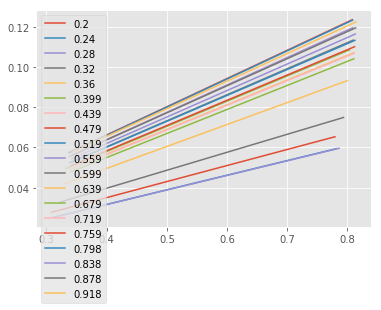

In [126]:
plotTools.plotEachSmilePred(locVolAreskyFormatted, 
                            interpolationBind)
plt.show()

# MC backtest 

#### PDE Backtest

Implement Crank-Nicolson scheme for black-scholes PDE in python within *priceEuropeanCallCranckNicholson* function.

It should return the price and the delta.


We want to solve Black-Scholes PDE with log return $x=\log{S}$ that is we want to find $u$ which solves :
$$u(T,x) = \left( e^x - K \right)^+, x \in \mathbb{R}$$
$$\partial_t u + (b - \frac{\sigma^2}{2}) \partial_x u + \frac{1}{2} \sigma^2 \partial_x^2 u  - b u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

Finite difference methods amounts to bound the domain $\mathcal{O} = [0,T) \times (-\infty,\infty)$ with a bounded one $[0,T) \times (x^-,x^+)$. 
We use dirichlet condition which in the case of european call gives $u(t, x^-) = 0$ and $u(t, x^+) =e^{-b (T-t)} (e^{x^+} - K)$ .

Then we discretize along time axis and space axis and approximate derivatives of $u$ with discrete variations.
Thus we can show for a given time step $h$ and log space step $k$ that we must solve the following linear algebra problem :

$$ \left[ I - h \theta A^k \right] u_{i} = \left[ I - h (1-\theta) A^k \right] u_{i+1} + h \left( \theta w^k(t_i) + (1-\theta) w^k(t_{i+1}) \right)$$
with $u_n^j = \left( e^{\log{S_0} + j k} - K \right)^+ , \forall j \in \mathcal{K}$ a discrete log space discretization.

$A$ is a tridiagonal matrix with $\alpha = \frac{\sigma^2}{2 k^2} - \frac{b}{2k}$ on the lower diagonal, $\gamma = \frac{\sigma^2}{2 k^2} + \frac{b}{2k}$ on the upper diagonal and $\beta = -\left( \frac{\sigma^2}{k^2} + b \right)$ on the main diagonal.
$w_{t_i}$ is a zero vector except the first (upper) element equal $0$ and the last element is equal to $ \gamma e^{-b h (n-i)} (e^{x^+} - K) $.

In the code we note $M^k = \left[ I - h \theta A^k \right]$ and $N^k = \left[ I - h (1-\theta) A^k \right]$.

Cranck Nicholson corresponds to a theta scheme with $\theta=0.5$.
When $\theta=1$ we have the so-call implicit scheme and for $\theta=1$ the explicit scheme.

Cranck-nicholson scheme has the advantage consistent of order two in time and in space.
For $\theta \neq 1/2$ we have only consistency of order one in time and two in space

In constrast with tree, space discretization is the same for each time step.

$$\partial_t u + \left((r_t-q_t) - \frac{\sigma^2 (x,t)}{2} \right) \partial_x u  + \frac{1}{2} \sigma^2 (x,t) \partial_x^2 u  - q_t u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

CFL condition :
$$ h \leq \frac{k^2}{\sigma_{sup}^2 + b_{sup} k^2}$$

Here we choose $k$ as $$2 * \sqrt{\frac{\sigma_{sup}^2 h}{ 1 - b_{sup} h}} $$

where $\sigma_{sup} = \sup\limits_{(x,t) \in \hat{\Theta}}{\sigma_{loc}(e^x,t)}$ and $b_{sup} = \sup\limits_{t \in [0,T]}{(r-q)(t)}$




In [127]:
nbTimeStep = 10#100
nbPaths = 100#100000


In [128]:
importlib.reload(backtest)

<module 'backtest' from './code/backtest.py'>

#### GP Local Volatility

In [130]:
testingDataSetAresky = dataSetConstruction.interpolatedLocalVolatility(locVolAreskyFormatted, 
                                                                       dataSetTest["Price"])

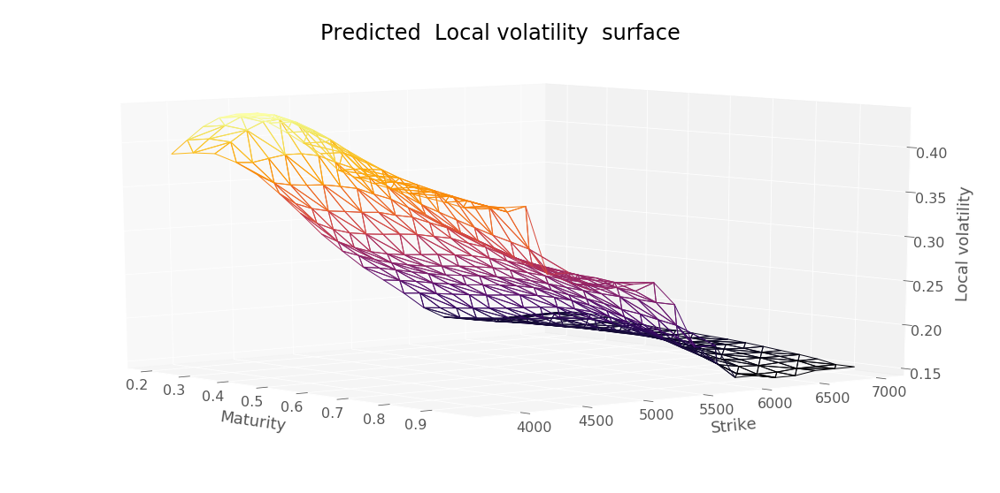

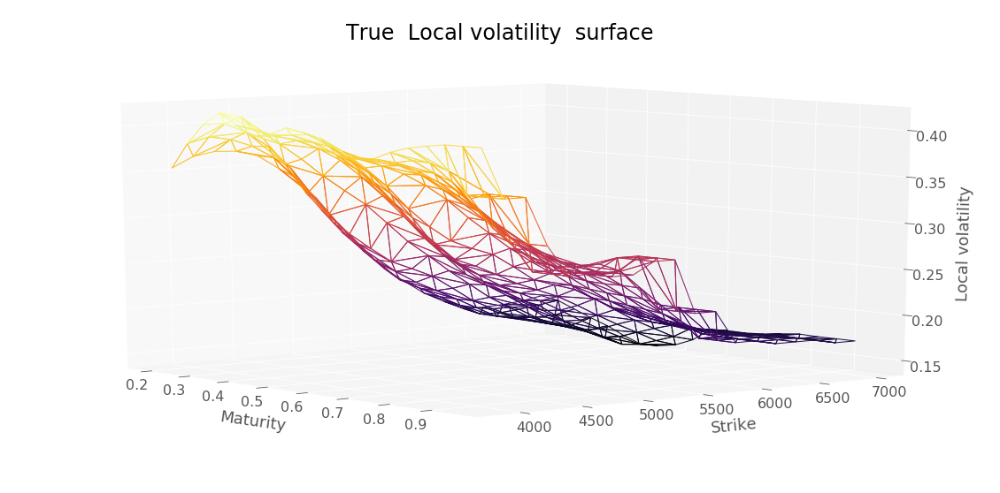

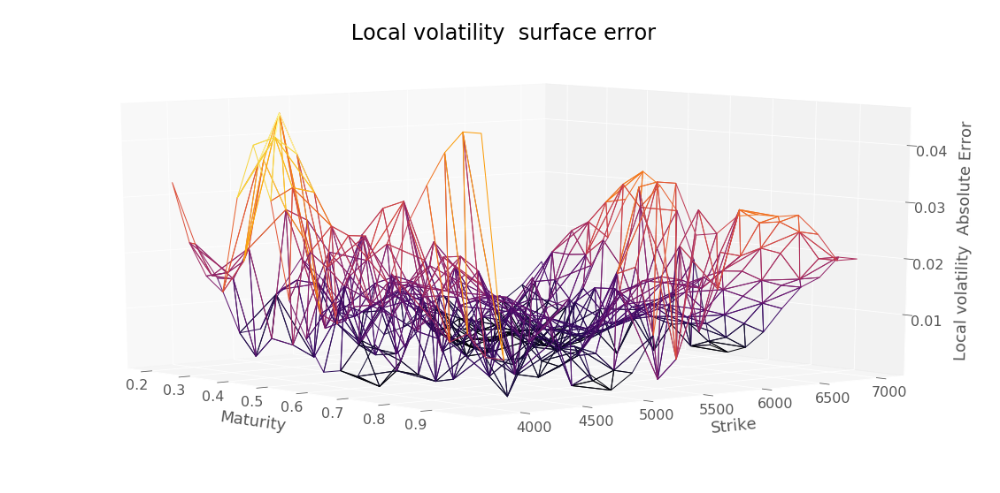

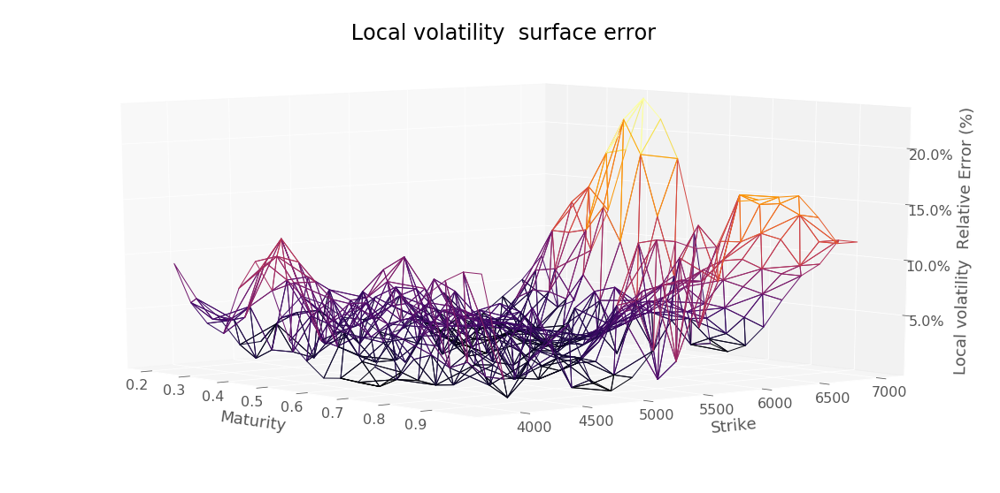

RMSE :  0.01568875310470875


In [105]:
plotTools.predictionDiagnosis(testingDataSetAresky, 
                              dataSetTest["locvol"], 
                              " Local volatility ",
                              yMin=KMin,
                              yMax=KMax)

In [131]:
nnAresky = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolAreskyFormatted["LocalVolatility"], 
                                                               x, 
                                                               y)

In [132]:
mcResSigmaAreskyTest = backtest.MonteCarloPricerVectorized(S0,
                                                           dataSetTest,
                                                           bootstrap,
                                                           nbPaths,
                                                           nbTimeStep,
                                                           nnAresky)
mcResSigmaAreskyTest.head()

Strike  Maturity
1400.0  0.942        6.828676
        0.942        2.818592
1600.0  0.942       21.636344
        0.942        7.328259
1650.0  0.175        0.000000
dtype: float64

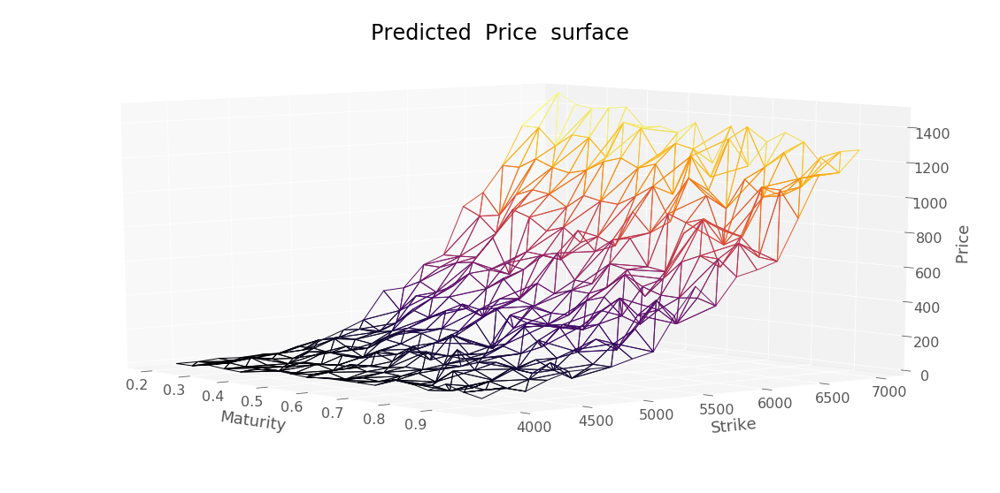

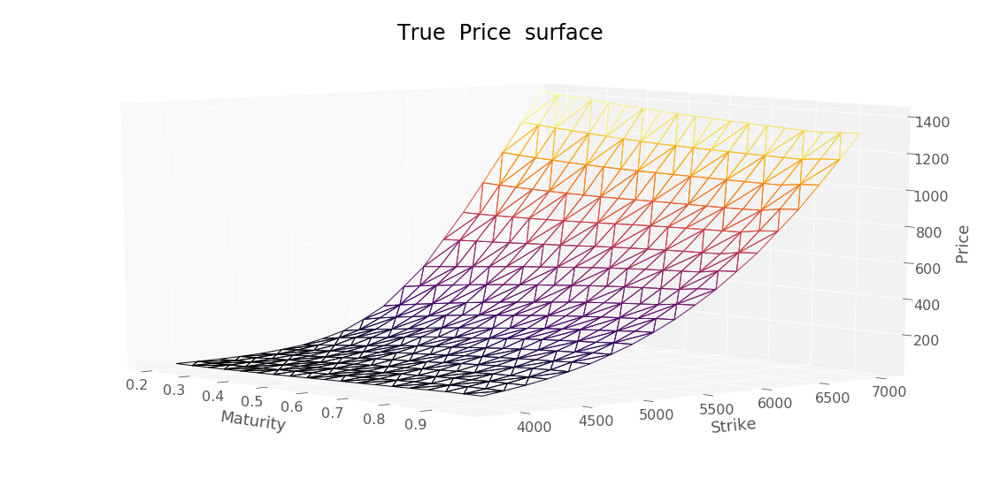

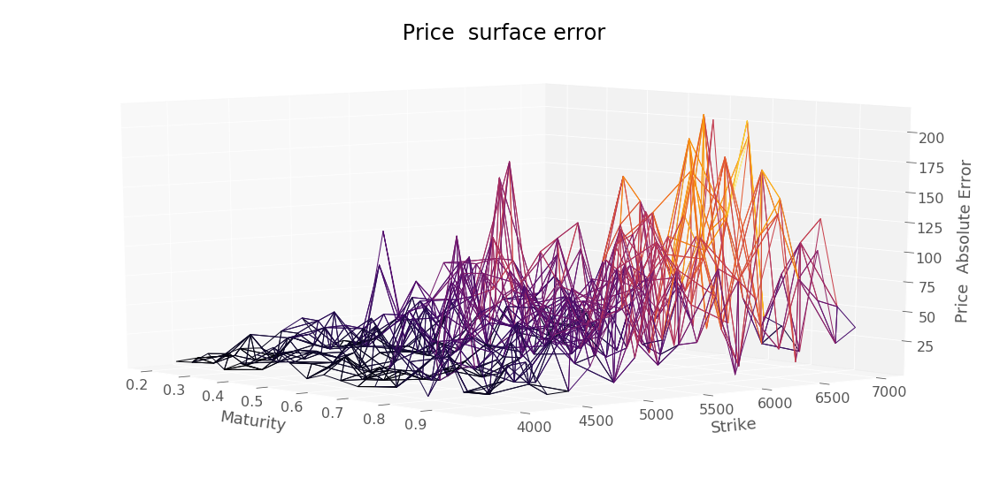

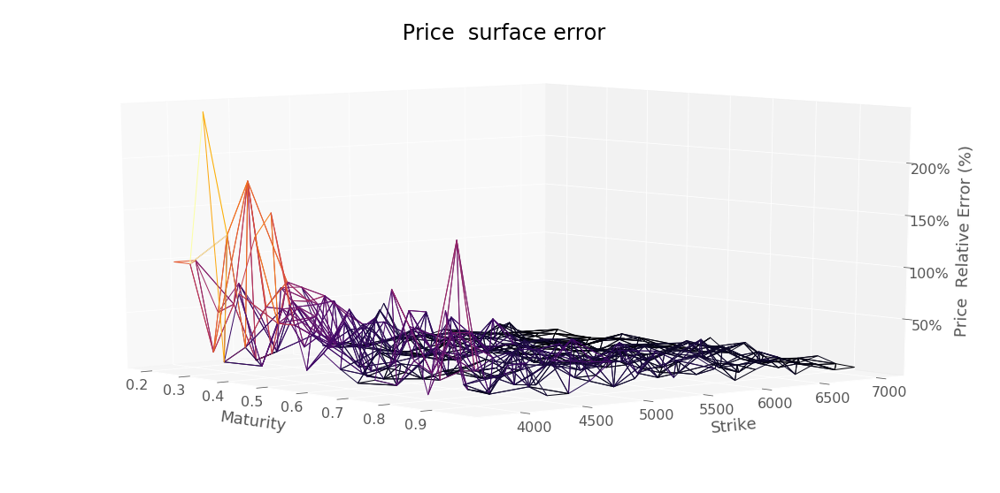

RMSE :  59.52967342339557


In [108]:
plotTools.predictionDiagnosis(mcResSigmaAreskyTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [109]:
mcResSigmaAreskyTest.to_csv(workingFolder + "mcResSigmaAreskyTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [110]:
mcResSigmaAreskyTrain = backtest.MonteCarloPricerVectorized(S0,
                                                            dataSet,
                                                            bootstrap,
                                                            nbPaths,
                                                            nbTimeStep,
                                                            nnAresky)
mcResSigmaAreskyTrain.head()

Strike  Maturity
3600    0.118        0.000000
        0.367        0.000000
        0.597       13.893588
        0.866        8.633896
3800    0.118        0.000000
dtype: float64

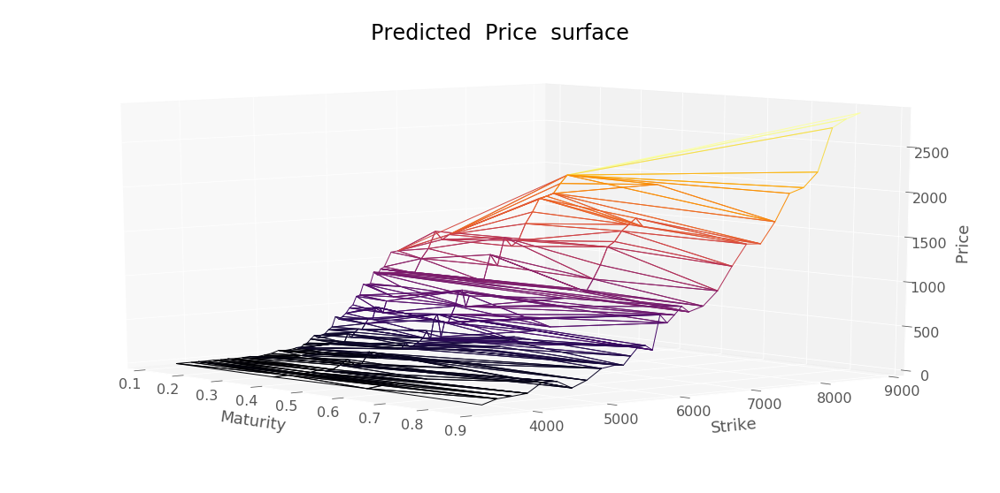

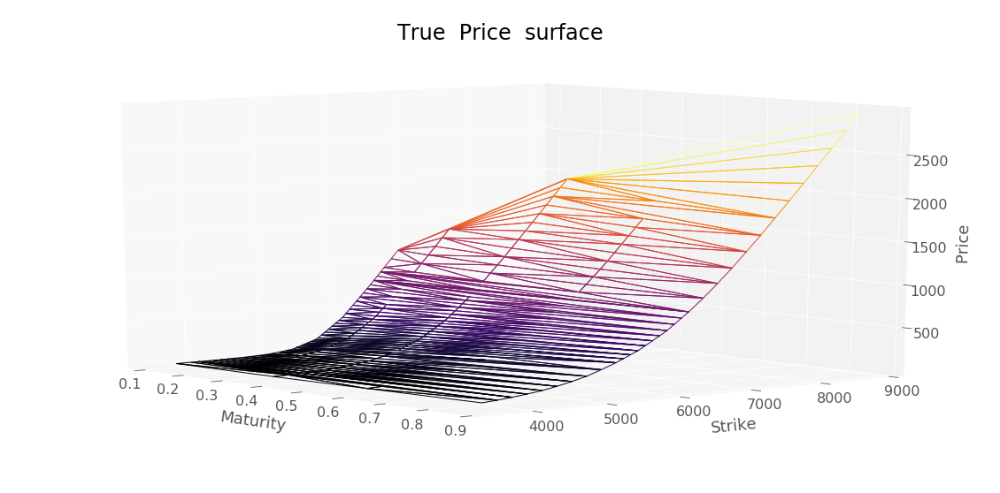

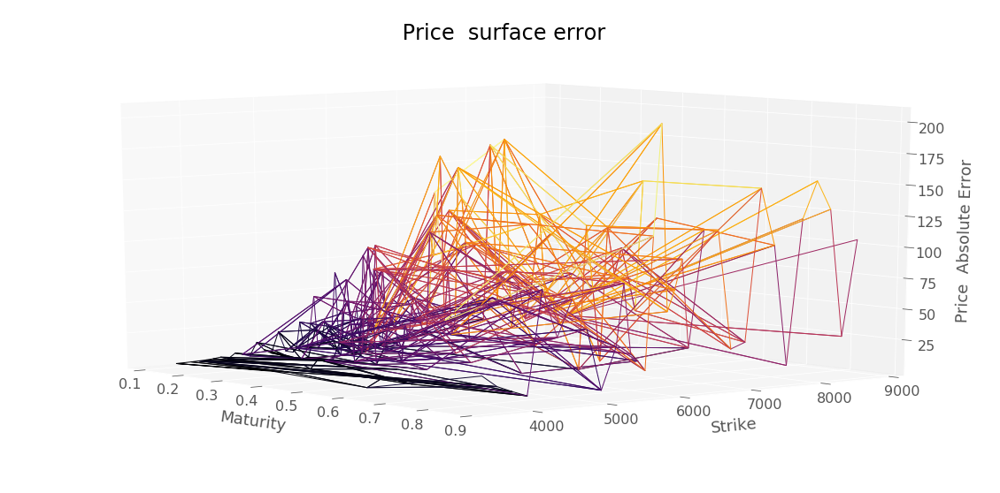

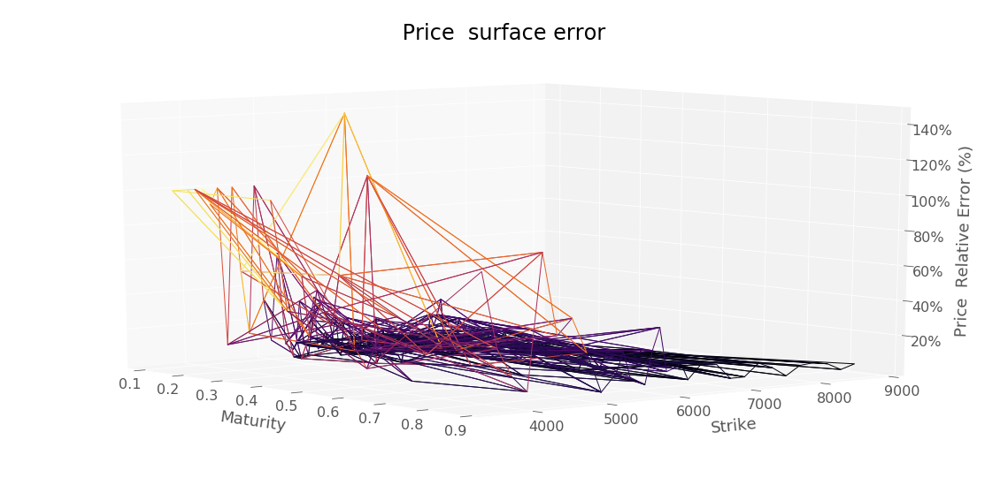

RMSE :  63.03983181447788


In [111]:
plotTools.predictionDiagnosis(mcResSigmaAreskyTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [112]:
mcResSigmaAreskyTrain.to_csv(workingFolder + "mcResSigmaAreskyTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


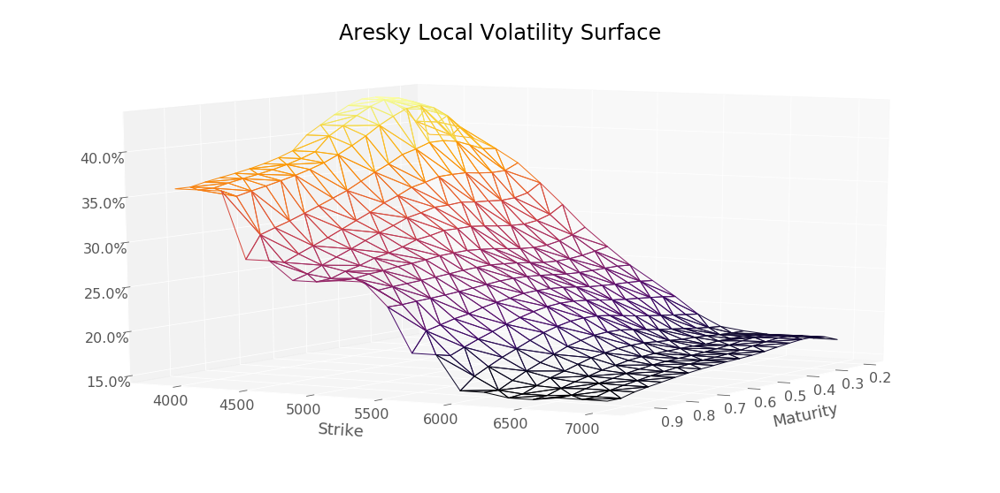

In [113]:
plotTools.plotSerie(testingDataSetAresky[testingDataSetAresky.index.get_level_values("Maturity") > 0.01],
                    Title = 'Aresky Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [114]:
pdeResSigmaAreskyTrain = backtest.PDEPricerVectorized(dataSet, S0, nnAresky, bootstrap)
pdeResSigmaAreskyTrain.head()

Strike  Maturity
3600    0.118        0.024807
        0.367        5.285168
        0.597       18.263646
        0.866       33.739158
3800    0.118        0.092928
dtype: float64

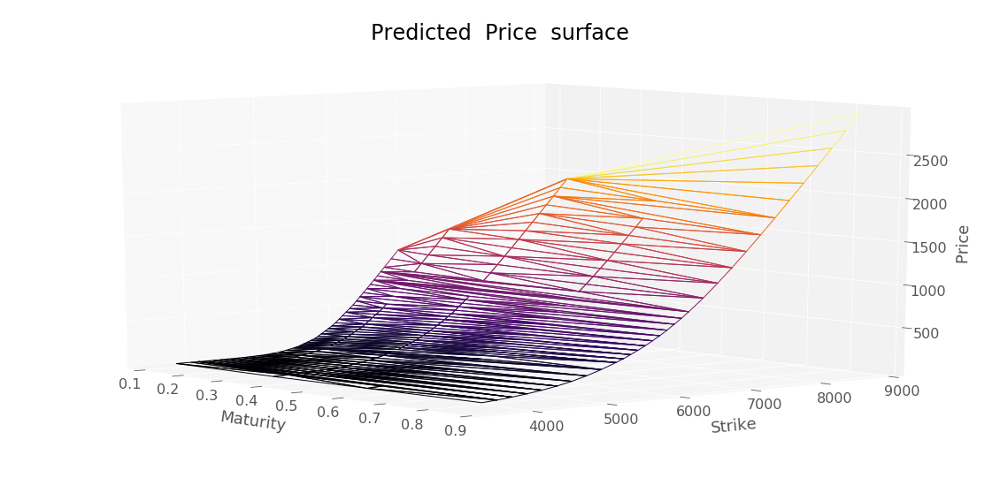

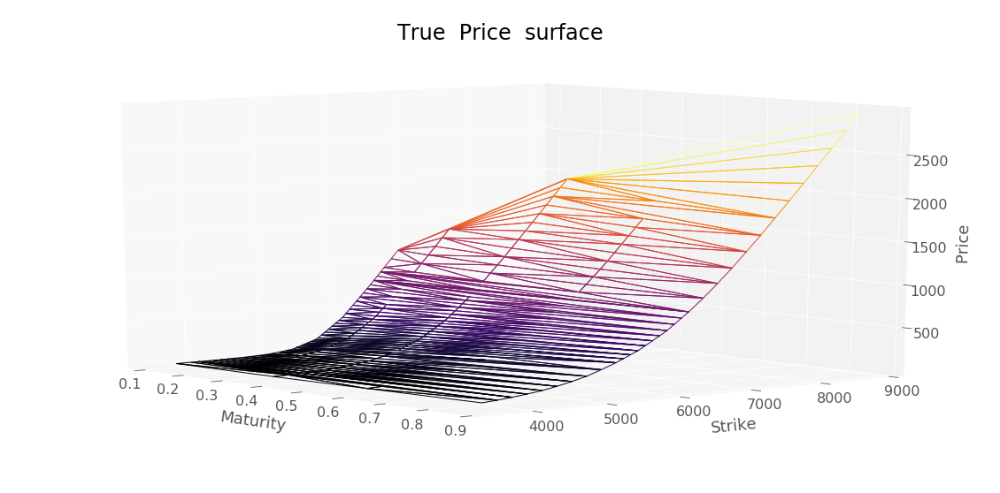

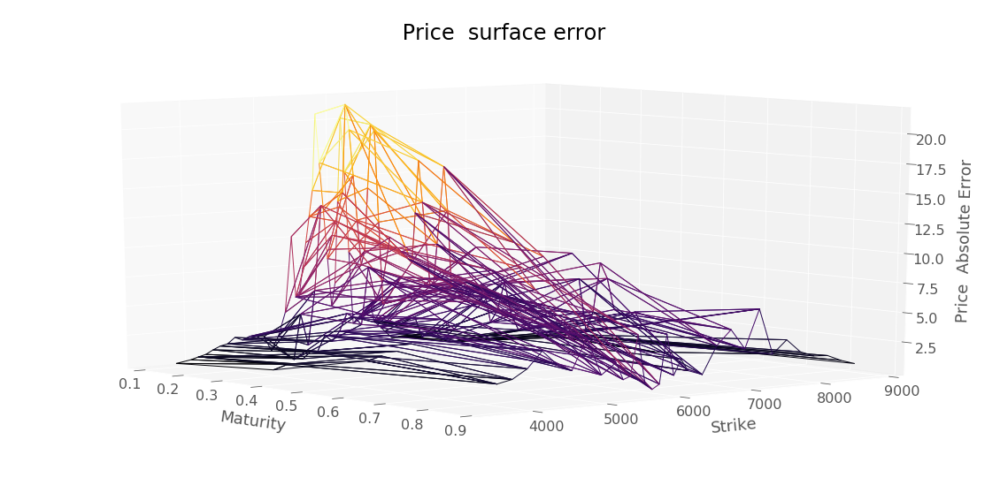

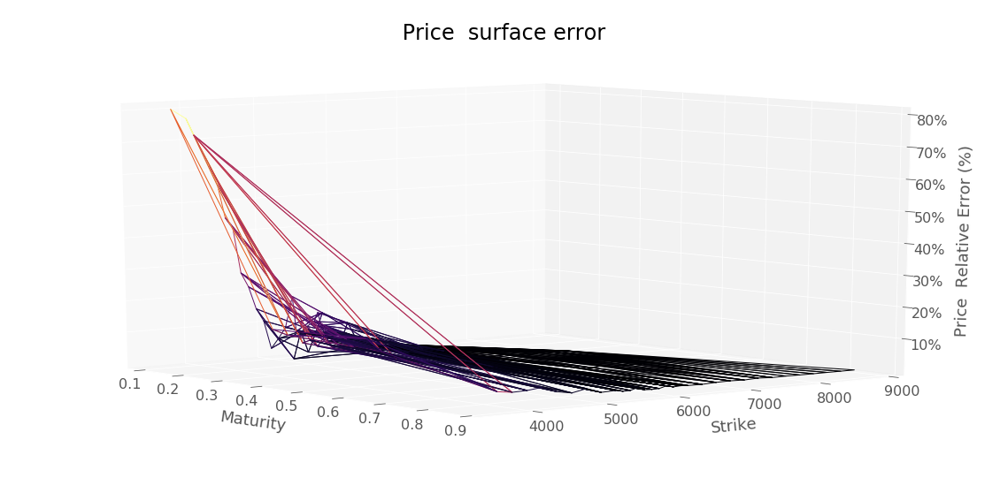

RMSE :  7.527944334447842


In [115]:
plotTools.predictionDiagnosis(pdeResSigmaAreskyTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [116]:
pdeResSigmaAreskyTrain.to_csv(workingFolder + "pdeResSigmaAreskyTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [119]:
pdeResSigmaAreskyTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnAresky, bootstrap)
pdeResSigmaAreskyTest.head()

Strike  Maturity
3858.6  0.200        1.497233
        0.242        2.986239
        0.284        5.150804
        0.326        7.915650
        0.368       11.124222
dtype: float64

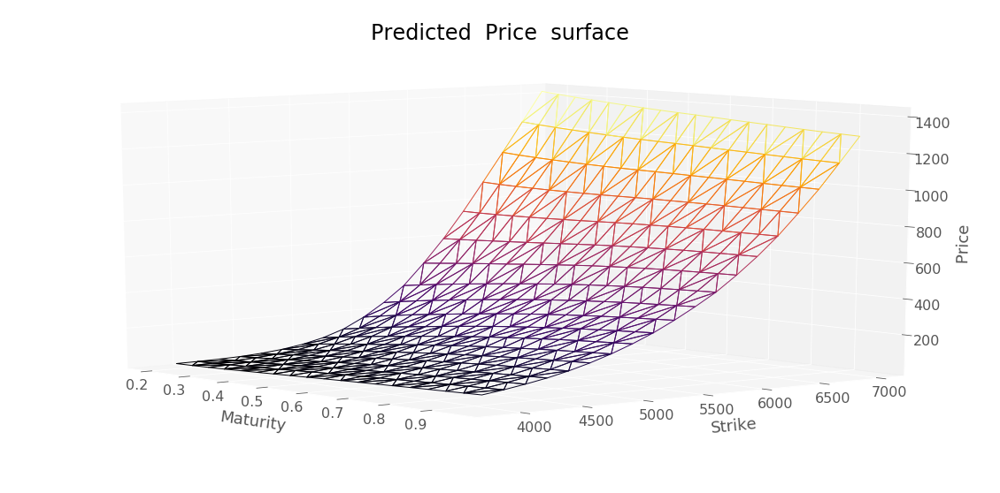

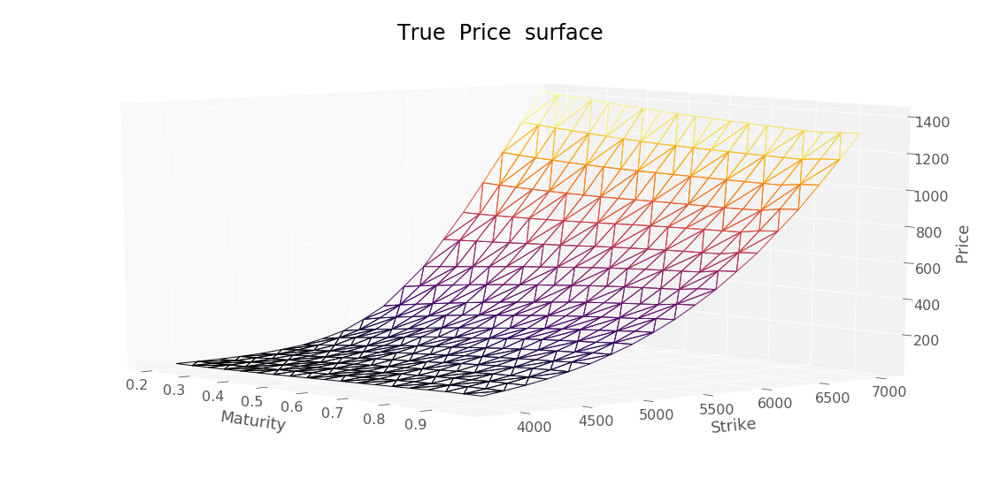

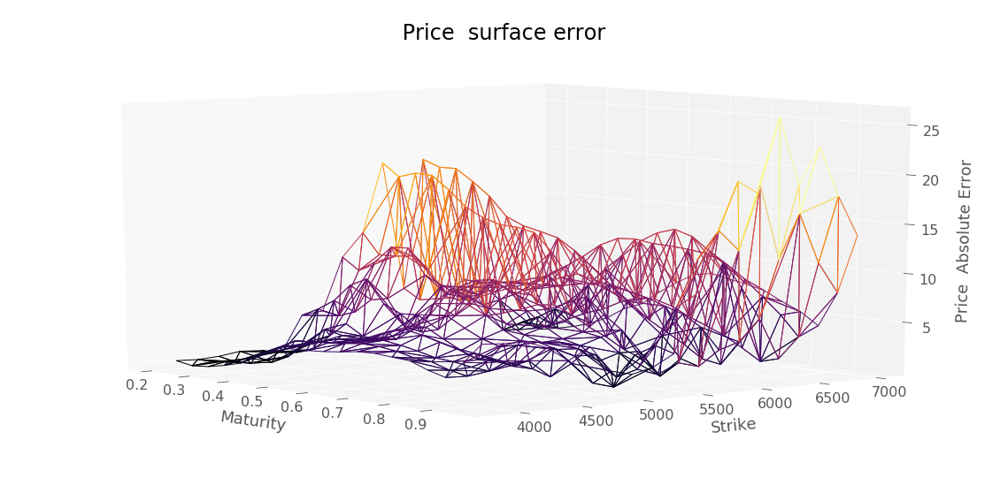

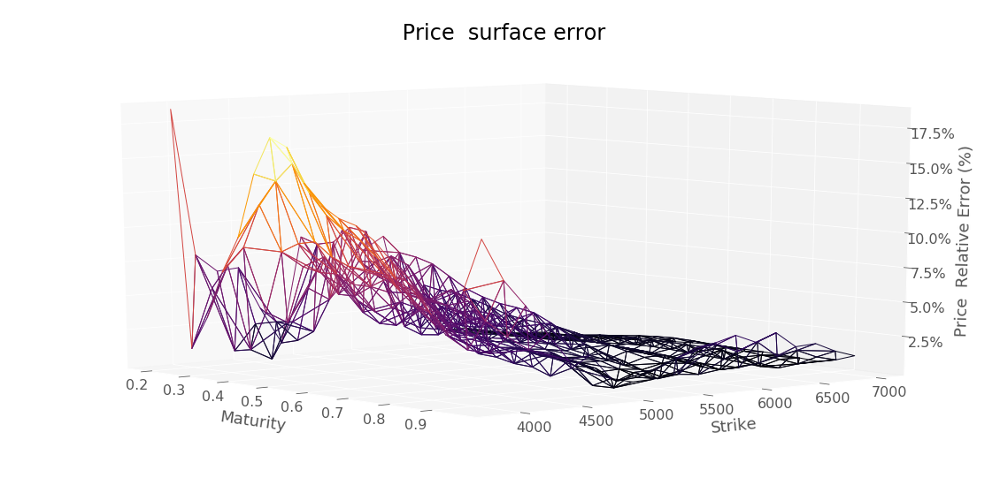

RMSE :  7.493935853415093


In [120]:
plotTools.predictionDiagnosis(pdeResSigmaAreskyTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [121]:
pdeResSigmaAreskyTest.to_csv(workingFolder + "pdeResSigmaAreskyTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


#### Tikhonov calibration

In [122]:
nnVolLocaleTykhonov = lambda x,y : backtest.interpolatedMCLocalVolatility(localVolatility["LocalVolatility"], x, y)


In [123]:
s = testingDataSetAresky.index.get_level_values("Strike").values
t = testingDataSetAresky.index.get_level_values("Maturity").values

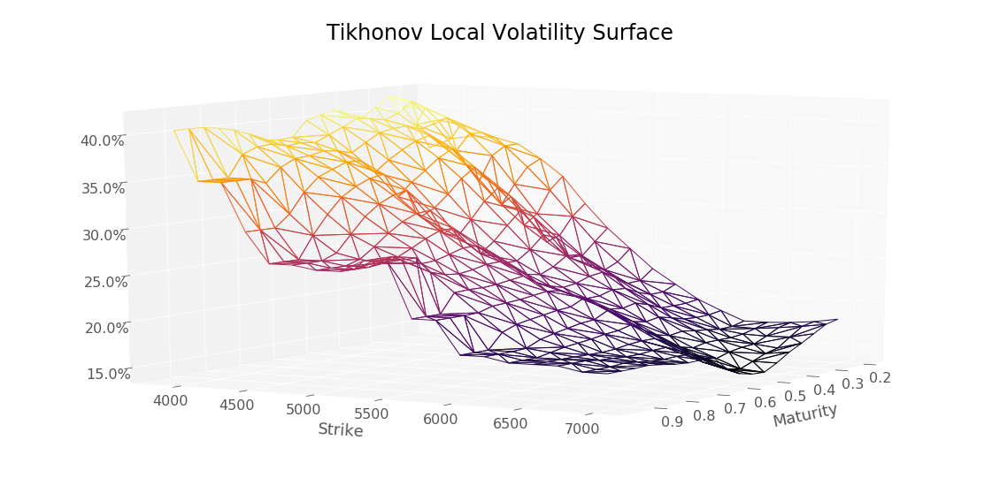

In [124]:
tikhonovLocVol = nnVolLocaleTykhonov(s, t)
plotTools.plotSerie(tikhonovLocVol[tikhonovLocVol.index.get_level_values("Maturity") > 0.01],
                    Title = 'Tikhonov Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [125]:
mcResTikhonovTest = backtest.MonteCarloPricerVectorized(S0,
                                                        dataSetTest,
                                                        bootstrap,
                                                        nbPaths,
                                                        nbTimeStep,
                                                        nnVolLocaleTykhonov)
mcResTikhonovTest.head()

Strike  Maturity
3858.6  0.200        0.568095
        0.242        8.990208
        0.284       10.218066
        0.326        9.116409
        0.368       15.431192
dtype: float64

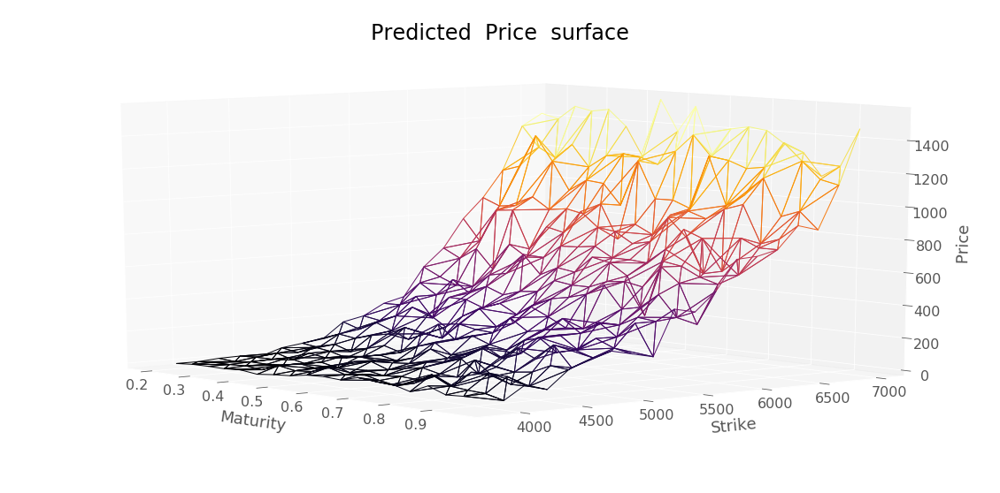

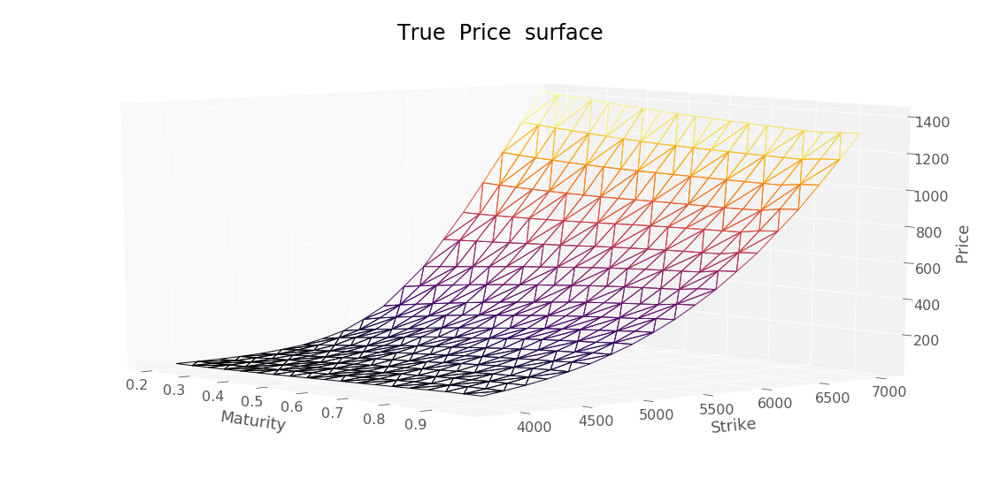

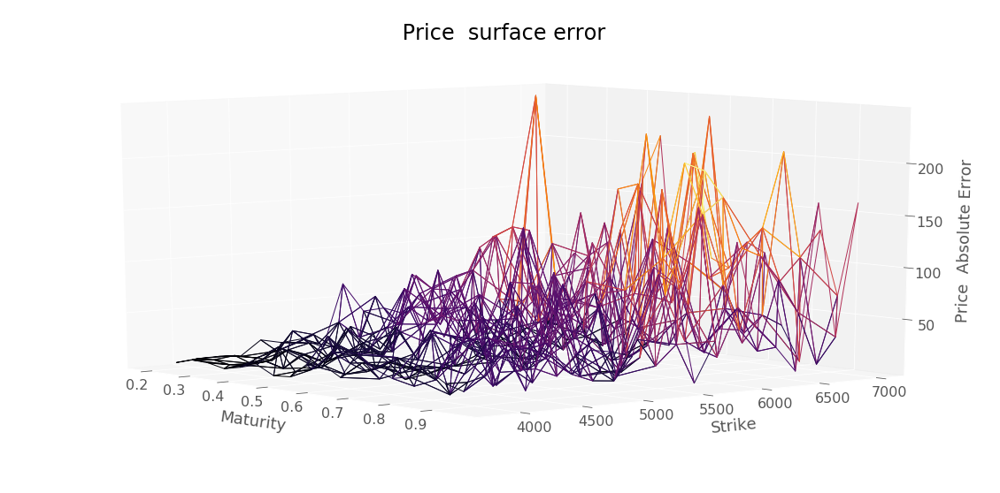

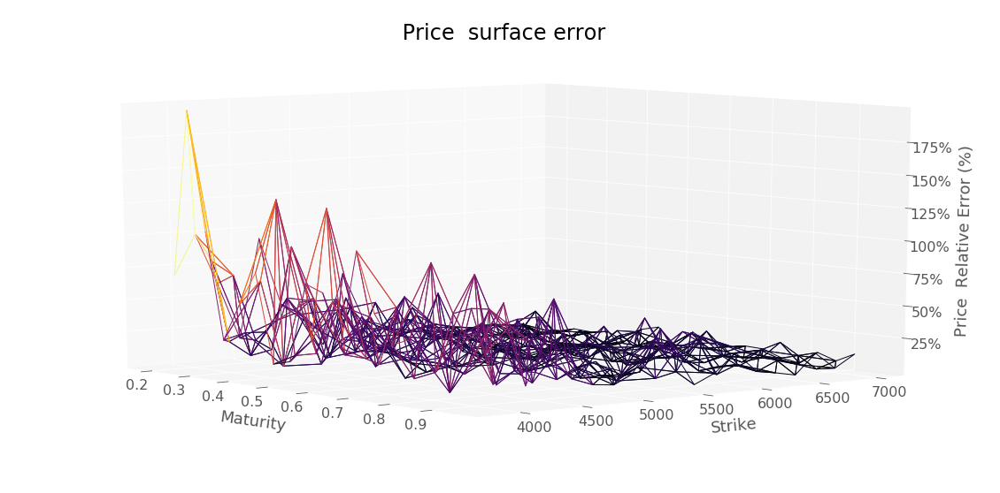

RMSE :  65.35494311648065


In [126]:
plotTools.predictionDiagnosis(mcResTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [127]:
mcResTikhonovTest.to_csv(workingFolder + "mcResTikhonovTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [128]:
mcResTikhonovTrain = backtest.MonteCarloPricerVectorized(S0,
                                                         dataSet,
                                                         bootstrap,
                                                         nbPaths,
                                                         nbTimeStep,
                                                         nnVolLocaleTykhonov)
mcResTikhonovTrain.head()

Strike  Maturity
3600    0.118        0.000000
        0.367        0.000000
        0.597       21.634106
        0.866       44.849111
3800    0.118        0.000000
dtype: float64

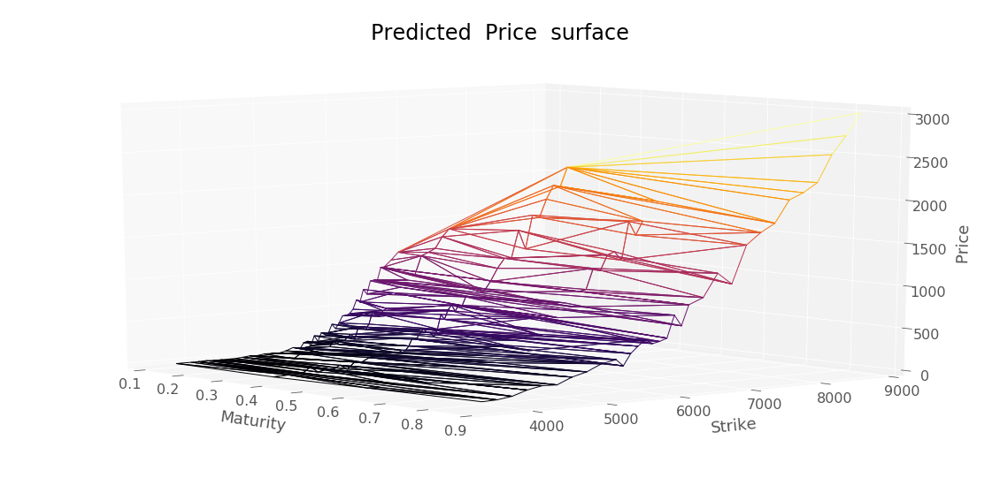

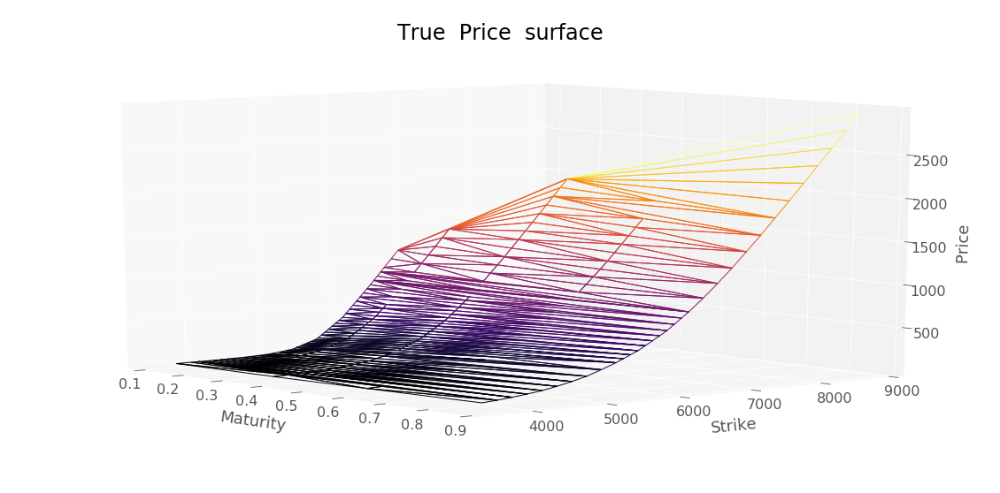

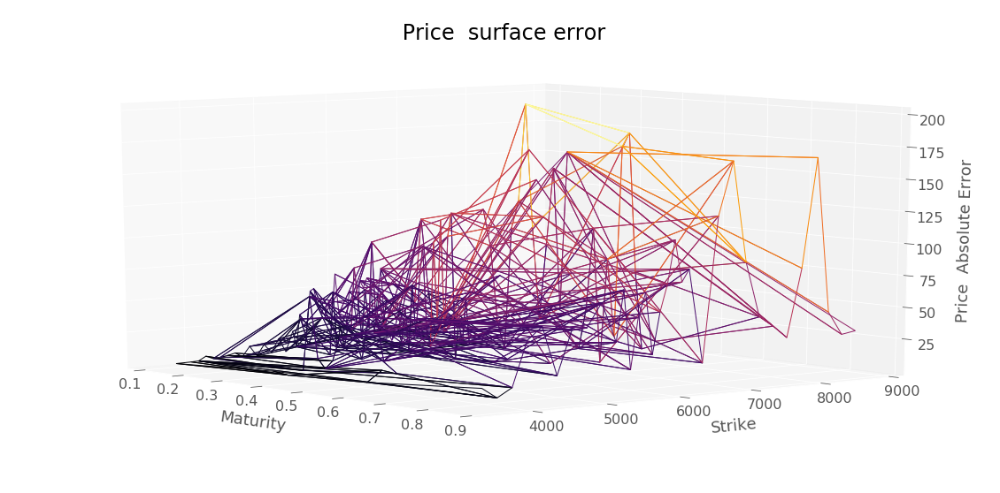

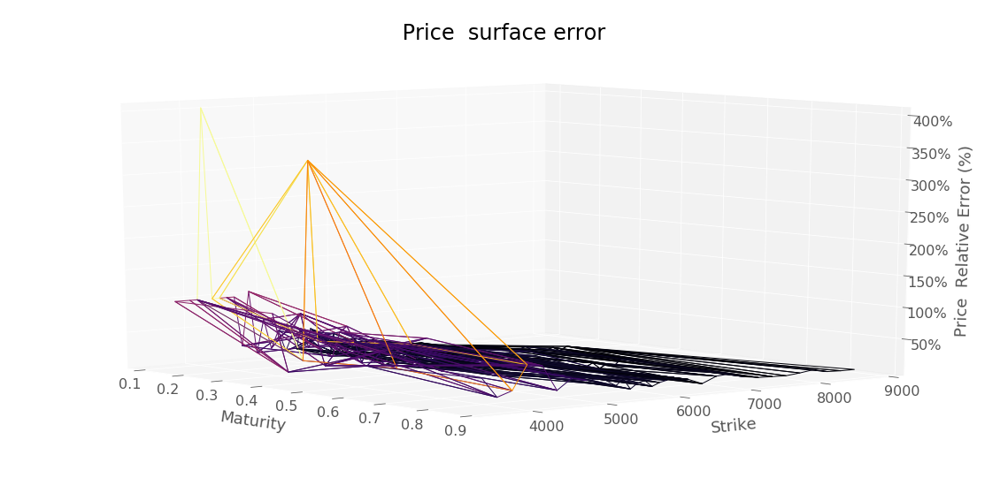

RMSE :  60.993962608159954


In [129]:
plotTools.predictionDiagnosis(mcResTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [130]:
mcResTikhonovTrain.to_csv(workingFolder + "mcResTikhonovTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [131]:
pdeResSigmaTikhonovTrain = backtest.PDEPricerVectorized(dataSet, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTrain.head()

KeyboardInterrupt: 

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTrain.to_csv(workingFolder + "pdeResSigmaTikhonovTrain.csv")

In [ ]:
pdeResSigmaTikhonovTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTest.to_csv(workingFolder + "pdeResSigmaTikhonovTest.csv")

#### Backtest Local volatility SSVI 

In [ ]:
nnSSVI = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVIDf["LocalVolatility"], x, y)

In [ ]:
mcResSSVITest = backtest.MonteCarloPricerVectorized(S0,
                                                    dataSetTest,
                                                    bootstrap,
                                                    nbPaths,
                                                    nbTimeStep,
                                                    nnSSVI)
mcResSSVITest.head()

In [ ]:
mcResSSVITest.to_csv(workingFolder + "mcResSSVITest.csv")

In [ ]:
plotTools.predictionDiagnosis(mcResSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
mcResSSVITrain = backtest.MonteCarloPricerVectorized(S0,
                                                     dataSet,
                                                     bootstrap,
                                                     nbPaths,
                                                     nbTimeStep,
                                                     nnSSVI)
mcResSSVITrain.head()

In [ ]:
plotTools.predictionDiagnosis(mcResSSVITrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
mcResSSVITrain.to_csv(workingFolder + "mcResSSVITrain.csv")

In [ ]:
testingDataSetSSVI = backtest.interpolatedLocalVolatility(locVolSSVIDf, testingDataSet["Price"])

In [ ]:
plotTools.plotSerie(testingDataSetSSVI[testingDataSetSSVI.index.get_level_values("Maturity") > 0.01],
                    Title = 'SSVI Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [ ]:
pdeResSigmaSSVITrain = backtest.PDEPricerVectorized(dataSet, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITrain.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITrain.to_csv(workingFolder + "pdeResSigmaSSVITrain.csv")

In [ ]:
pdeResSigmaSSVITest = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITest.to_csv(workingFolder + "pdeResSigmaSSVITest.csv")

#### Compute errors

In [ ]:
PriceconvexSoftGatheralVolModelTrain = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTrain.csv", 
                                                             parseHeader=0)
PriceconvexSoftGatheralVolModelTrain.head()

In [ ]:
mcResSSVITrain = backtest.loadMCPrices("mcResSSVITrain.csv")
mcResSSVITrain.head()

In [ ]:
backtest.rmse(mcResSSVITrain[2], dataSet["Price"])

In [ ]:
mcResTikhonovTrain = backtest.loadMCPrices("mcResTikhonovTrain.csv")
mcResTikhonovTrain.head()

In [ ]:
backtest.rmse(mcResTikhonovTrain[2], dataSet["Price"])

In [ ]:
mcResSigmaAreskyTrain = backtest.loadMCPrices("mcResSigmaAreskyTrain.csv")
mcResSigmaAreskyTrain.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTrain[2], dataSet["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Train = backtest.loadMCPrices("mcResVolLocale7Train.csv",parseHeader=0)
mcResVolLocale7Train.head()

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
#Grid test
mcResVolLocale8Train = backtest.loadMCPrices("mcResVolLocale8Train.csv",parseHeader=0)
mcResVolLocale8Train.head()

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
PriceconvexSoftGatheralVolModelTest = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTest.csv", 
                                                            parseHeader=0)
PriceconvexSoftGatheralVolModelTest.head()

In [ ]:
mcResSSVITest = backtest.loadMCPrices("mcResSSVITest.csv")
mcResSSVITest.head()

In [ ]:
backtest.rmse(mcResSSVITest[2], dataSetTest["Price"])

In [ ]:
mcResTikhonovTest = backtest.loadMCPrices("mcResTikhonovTest.csv")
mcResTikhonovTest.head()

In [ ]:
backtest.rmse(mcResTikhonovTest[2], dataSetTest["Price"])

In [ ]:
mcResSigmaAreskyTest = backtest.loadMCPrices("mcResSigmaAreskyTest.csv")
mcResSigmaAreskyTest.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTest[2], dataSetTest["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Test = backtest.loadMCPrices("mcResVolLocale7Test.csv",parseHeader=0)
mcResVolLocale7Test.head()

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])

In [ ]:
#Grid test
mcResVolLocale8Test = backtest.loadMCPrices("mcResVolLocale8Test.csv",parseHeader=0)
mcResVolLocale8Test.head()

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])